# Plans

Completed 
- Flat
- Blackpoint

Missing
- LensDistortion   
    - Finding an appropriate target might not be possible
    - Instead try large overlap between two images and minimize the difference
        Anything on the right scale should be good
        Allthough enlargement difference between steps might be causing the misalignement, say 90% alignment, hand align by central area
        If  this works, try doing it seperate for each color channel



Imaging for lens distortion
- Subject: Some tiny QR code like thing 1 by 1 mm large, taking 3x3 grid of it with 80% overlap 
- Could also do my ing card for refinement
- Large overlap, low depth so focus stacking wont take long


Maybe Later
- PSF estimation wiht nearest neighbour (code should still be somewhere in this repo)
- Retake color calibration with a script that modifies exposure values to achieve an 80% saturation in any color channel on average - I think it may have been to dark leading to larger error margins (white is blue at the moment)

In [1]:
import os, json
import matplotlib.pyplot as plt
import numpy as np
import scipy
import plotly
import plotly.express as px
import h5py
import colour
from PIL import Image
from scipy.interpolate import interp1d

In [2]:
def load_img(path, blackpoint, flat=None):
    with h5py.File(path, 'r') as f:
        ccm_img = f["image"][()]
    ccm_img = ccm_img.view('uint16')
    ccm_image = np.zeros((ccm_img.shape[0]//2,ccm_img.shape[1]//2, 3),dtype='uint16')
    ccm_image[:,:,0] = ccm_img[1::2,1::2]
    ccm_image[:,:,1] = (ccm_img[::2,1::2]+ccm_img[1::2,::2])//2
    ccm_image[:,:,2] = ccm_img[::2,::2]
    # Scale to UInt16
    ccm_image = (ccm_image /(2**12-1)*(2**16-1)).astype('uint16')
    # Apply blackpoint
    mask = ccm_image <= blackpoint
    ccm_image[mask] = 0
    ccm_image = np.where(ccm_image > blackpoint, ccm_image - blackpoint, ccm_image)
    if flat is None:
        return ccm_image[:,:-4,:]
    else:
        if ccm_image[:,:-4,:].shape == (2028,1520,3):
            return np.clip(ccm_image[:,:-4,:]/np.swapaxes(np.swapaxes(flat.T, 0, 1), 1, 2), 0, (2**16-1)).astype('uint16')
        elif ccm_image[:,:-4,:].shape == (1520,2028,3):
            return np.clip(ccm_image[:,:-4,:]/flat, 0, (2**16-1)).astype('uint16')
        else:
            print(ccm_image.shape)

## Compute Black level, flat field, and CCM

### Black level
Just done in repl, mean value of 20 images scaled to uint16 is:

[255.84299803, 255.43195072, 255.83721712]

With std:

[0.56442435, 0.50747283, 0.56564709]

And Min:

[253, 253, 253]

And Max:
[262, 259, 262]

So lets just subtract 255 from each channel

In [3]:
blackpoint = np.array([255,255,255],dtype='uint16')
with h5py.File("../CalibrationData/Calibration.hdf5", "a") as f:
    if "Blackpoint" not in f.keys():
        dataset = f.create_dataset("Blackpoint", data=blackpoint)

### Flat Field
See script take_white_iages.py in NewDataAquisition

In [250]:
f_im = np.zeros((1520,2028,3), 'float64')
for i in os.listdir("./Flats"):
    # Norm each 0 to 1
    f_im += load_img(os.path.join("./Flats", i), blackpoint) / (2**16-1)
# Norm final 0 to 1
f_im /= len(os.listdir("./Flats"))

In [251]:
print("Min, Max, Mean")
print(f_im.min(), f_im.max(), f_im.mean(axis=(0,1)))

Min, Max, Mean
0.21794033722438377 0.6695027084763872 [0.24007462 0.63591781 0.37310024]


sanity check
[1. 1. 1.]
Some statistics
R
Min, Max, Mean, STD
0.8617 -> 1.0, 0.9492 +- 0.01928
G
Min, Max, Mean, STD
0.8604 -> 1.0, 0.9498 +- 0.02136
B
Min, Max, Mean, STD
0.8374 -> 1.0, 0.9362 +- 0.01955


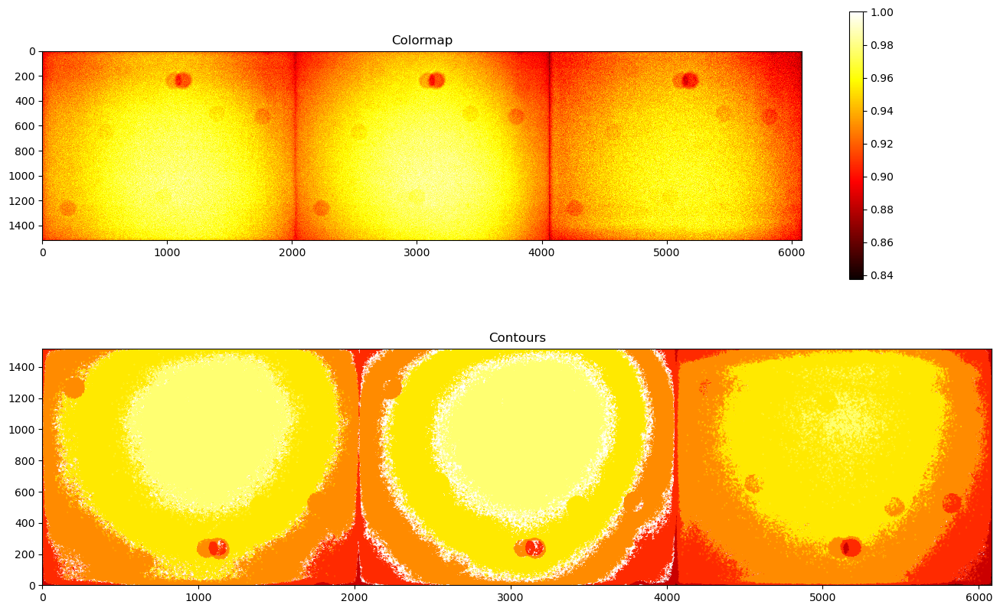

In [252]:
# Compute flat as per channel 
flat = f_im
for i in range(3):
    flat[:,:,i] /= np.max(f_im[:,:,i])
print("sanity check")
print(flat.max(axis=(0,1)))
print("Some statistics")
indx  = {0: "R", 1: "G", 2:"B"}
for i in range(3):
    print(indx[i])
    print("Min, Max, Mean, STD")
    print("{:.4} -> {:.4}, {:.4} +- {:.4}".format(flat[:,:,i].min(),flat[:,:,i].max(), flat[:,:,i].mean(),flat[:,:,i].std()))

stacked_image = np.hstack((flat[:, :, 0], flat[:, :, 1], flat[:, :, 2]))

fig, axs = plt.subplots(2,1, figsize=(16, 10))

im = axs[0].imshow(stacked_image, cmap='hot', interpolation='nearest')
fig.colorbar(im, ax=axs[0])
axs[0].set_title('Colormap')

# Second subplot: Plot the contours
contour_levels = np.linspace(stacked_image.min(), stacked_image.max(), num=8)
contour_plot = axs[1].contour(stacked_image, levels=contour_levels, cmap='hot')
axs[1].set_title('Contours')
axs[1].set_aspect('equal')  # Keep aspect ratio equal

# Display the plots
plt.show()

In [254]:
# Save the flat field
with h5py.File("../CalibrationData/FlatField.hdf5", "w") as f:
    dataset = f.create_dataset("flat", data=flat)
    dataset.attrs['n_im'] = len(os.listdir("./Flats"))
with h5py.File("../CalibrationData/Calibration.hdf5", "a") as f:
    if "flat" not in f.keys():
        dataset = f.create_dataset("flat", data=flat)

### CCM calibration
See script CCM_images.py in NewDataAquisition 

In [53]:
import requests
from bs4 import BeautifulSoup
# We need to populate a ral code to RGB dictionary
def getRGBforRAL(RAL):
    # We will source from 
    url = 'https://rgb.to/ral/{}'.format(RAL)
    res = requests.get(url)
    soup = BeautifulSoup(res.text, 'html.parser')
    rgb_input = soup.find('input', {'id': 'RGB'})
    if rgb_input:
        rgb_value = rgb_input['value']
        rgb = list(map(int, rgb_value.split(',')))
        rgb = [i/(2**8-1)*(2**16-1) for i in rgb]
        return rgb
    else:
        print(f"RGB value not found for RAL {RAL}")
        return None

[21106.50077639 21974.6909357  15868.06593253]


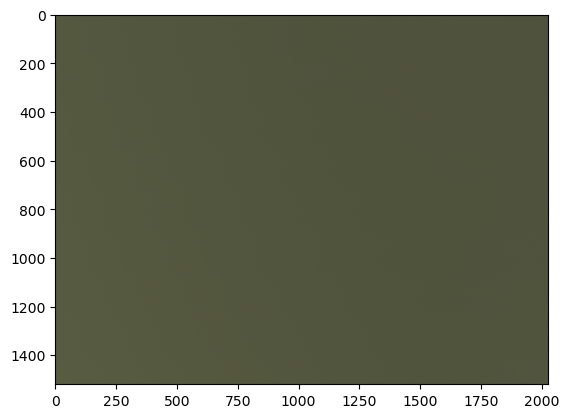

In [68]:
img = load_img("./CCM/1015/2024-08-14T14:27:33.490261.hdf5",blackpoint,flat)

plt.imshow(np.dot(img/(2**16-1), M))
print(np.dot(img, M).mean(axis=(0,1)))

In [54]:
#from ral_colors import RAL

ral_codes =sorted(["3020","5015","6001","1023","5010","2004","7042","7046","9006","7016","9003","9017","4005","5018","6018","8003","8007","7036","9010","1015","3027","3022","8004","7035","2003","5017", "1021", "7047", "6016","6017",'1020',"1019","1018","1017","1016","4002","4003","4004","4006","4007","6002","6003","6019","6020","6021","8000","7015"])
ral_colors = [getRGBforRAL(i) for i in ral_codes]
ral_measured = np.zeros((len(ral_codes),3))
path = "./CCM"


In [55]:


dirs = sorted(os.listdir(path))
for i in range(len(dirs)):
    if os.path.isdir(os.path.join(path,dirs[i])):
        img = np.zeros((1520,2028,3),'float64')
        counter = 0
        print("RAL: {}".format(dirs[i]))
        print(ral_colors[i])
        print("Mean, Std, Max, Min (normalized)")
        for j in os.listdir(os.path.join(path,dirs[i])):
            tmp_im = load_img(os.path.join(path,dirs[i],j), blackpoint, flat=flat)
            img += tmp_im.astype('float64')
            tmp_im = tmp_im/(2**16-1)
            print(tmp_im.mean(axis=(0,1)), tmp_im.std(axis=(0,1)),tmp_im.max(axis=(0,1)),tmp_im.min(axis=(0,1)))
            counter += 1
        img = img/counter
        indx = [k for k in range(len(ral_codes)) if ral_codes[k]==dirs[i]]
        ral_measured[indx[0]]=img.max(axis=(0,1))

RAL: 1015
[59110.0, 53970.0, 46517.0]
Mean, Std, Max, Min (normalized)
[0.20290351 0.45623033 0.24044602] [0.0059771  0.0131817  0.00707146] [0.23228809 0.5156939  0.27507439] [0.17854582 0.41994354 0.21472496]
[0.20295246 0.45635219 0.24047596] [0.00598814 0.01320604 0.00708096] [0.23268482 0.51366445 0.27541009] [0.16427863 0.42124056 0.21441978]
[0.20288402 0.4561712  0.2404389 ] [0.00597546 0.01316643 0.00706946] [0.23512627 0.51120775 0.27313649] [0.17923247 0.41972992 0.21123064]
[0.20288237 0.456175   0.24045065] [0.00598005 0.01317208 0.00707254] [0.23414969 0.51073472 0.27779049] [0.17897307 0.41898222 0.21383993]
[0.20291478 0.45625626 0.24044567] [0.00597876 0.01317483 0.00707228] [0.23277638 0.5129778  0.27426566] [0.17933928 0.41986725 0.21484703]
RAL: 1016
[61937.0, 56797.0, 14392.0]
Mean, Std, Max, Min (normalized)
[0.21757738 0.49038624 0.1597936 ] [0.0062555  0.01354053 0.00449847] [0.24762341 0.54792096 0.18275731] [0.19084459 0.45171283 0.14155795]
[0.21754387 0.4902

In [57]:
# The absolute magnitude for all colors will still vary
# So we take the ratio for each measured data point and multiply
# ral_measured = [ral_measured[i] * (sum(ral_colors[i])/sum(ral_measured[i])) for i in range(len(ral_measured))]

ral_colors   = [np.array(i)/sum(i) for i in ral_colors  ]
ral_measured = [np.array(i)/sum(i) for i in ral_measured]
# And now we should be good

In [58]:
# And we solve
# We correct as the residual is massive
#residuals = [np.abs(np.dot(M,np.array(ral_measured[i]))-np.array(ral_colors[i])) for i in range(len(ral_codes))]
#mask = np.array(residuals).mean(axis=-1)<np.array(residuals).mean()-0.5*np.array(residuals).std()
#mask[:] = True
#print(mask)
#print(sum(mask))
M, residual, rank, singular = np.linalg.lstsq(np.array(ral_measured), np.array(ral_colors), rcond=-1)

In [59]:
M, residual, rank, singular

(array([[ 2.10455266, -0.37043038, -0.73412228],
        [ 0.28754782,  0.81668834, -0.10423615],
        [-1.13049606,  0.31444905,  1.81604701]]),
 array([0.28110562, 0.22647814, 0.07070173]),
 3,
 array([4.04625313, 0.54030202, 0.47169947]))

In [82]:
with h5py.File("../CalibrationData/Calibration.hdf5", "a") as f:
    if "CCM" not in f.keys():
        dataset = f.create_dataset("CCM", data=M)

Expect 0 to 1
1.0
Expect 0 to 65535
30842.0
1.5081650320637525
25755.738837390218


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


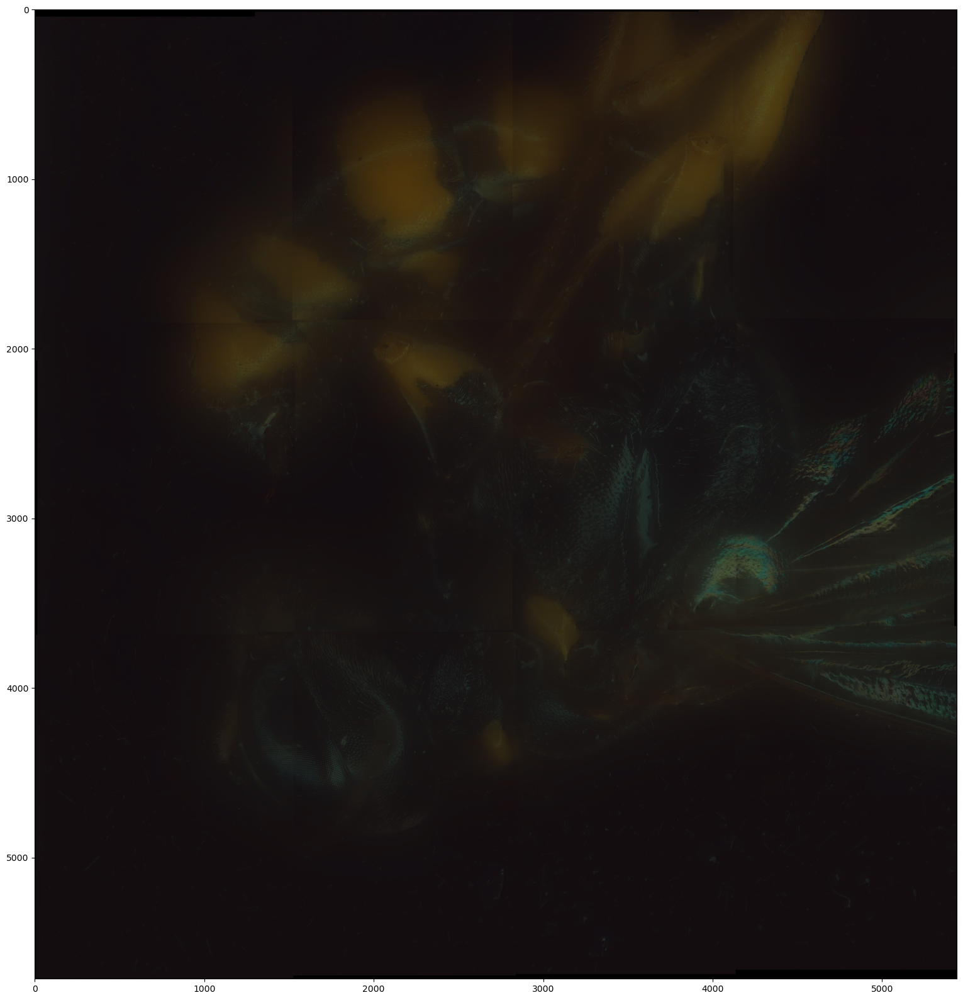

In [110]:
from PIL import Image
fig = plt.figure(figsize=(20,20))
img = np.array(Image.open("/home/felix/Manual_AgainFakeBee2.png"))[:,:,0:3]
h,w,c = img.shape

img = (img/(2**8-1)*(2**16-1) - blackpoint)

mean_tmp = img.max(axis=-1).reshape(*img.mean(axis=-1).shape,1)
tmp = img / mean_tmp
print("Expect 0 to 1")
print(tmp.max())
print("Expect 0 to {}".format(2**16-1))
print(mean_tmp.max())
tmp = np.dot(tmp.reshape((h*w, 3)), M).reshape(h,w,3)
print(tmp.max())
tmp = tmp*mean_tmp
print(tmp.max())

# Remove low order pixels
#thresh=np.sum(np.min(tmp[5000:,:1000],axis=(0,1))+0.5*np.std(tmp[5000:,:1000],axis=(0,1)))
#tmp[tmp.sum(axis=(-1))<thresh] = 0

gamma = [0, 0,512, 2304,1024, 4608,1536, 6573,2048, 8401,2560, 9992,3072, 11418,3584, 12719,4096, 13922,4608, 15045,5120, 16103,5632, 17104,6144, 18056,6656, 18967,7168, 19839,7680, 20679,8192, 21488,9216, 23028,10240, 24477,11264, 25849,12288, 27154,13312, 28401,14336, 29597,15360, 30747,16384, 31856,17408, 32928,18432, 33966,19456, 34973,20480, 35952,22528, 37832,24576, 39621,26624, 41330,28672, 42969,30720, 44545,32768, 46065,34816, 47534,36864, 48956,38912, 50336,40960, 51677,43008, 52982,45056, 54253,47104, 55493,49152, 56704,51200, 57888,53248, 59046,55296, 60181,57344, 61292,59392, 62382,61440, 63452,63488, 64503,65535, 65535]
gamma = np.array(gamma).reshape(len(gamma)//2,2)
#Gamma
gamma_correction_function = interp1d(gamma[:,0], gamma[:,1], kind='cubic', fill_value="extrapolate")
#tmp = gamma_correction_function((tmp).astype('uint16'))


#img = (img/(2**8-1) - blackpoint/(2**16-1))#/ np.swapaxes(np.swapaxes(flat.T, 0, 1), 1, 2)
#img = np.dot(img.reshape((h*w, 3)), M).reshape(h,w,3)
#/ np.swapaxes(np.swapaxes(flat.T, 0, 1), 1, 2)


plt.imshow(tmp/(2**16-1))
#Image.fromarray((tmp/tmp.max()*(2**8-1)).astype('uint8')).save("./CustomCCM.png")

## Lens Distortion

In [1]:
import os, json
import matplotlib.pyplot as plt
import numpy as np
import scipy
import plotly
import plotly.express as px
import h5py
import colour
from PIL import Image
import copy
from scipy.interpolate import interp1d
import cv2 as cv

## Function definitions

from scipy.ndimage import map_coordinates
from scipy.interpolate import griddata
from skimage.metrics import structural_similarity as ssim


def remove_black_borders(imageA, imageB):
    """
    Required to compute ssim accurately

    Remove fully black rows and columns from both images.
    A pixel is considered 'black' if all its channels have a value of 0.
    """
    # Check for black rows and columns in both images
    # This assumes the images are grayscale or binary. If color, adjust the condition accordingly.
    if len(imageA.shape) == 3 and imageA.shape[2] == 3:
        non_black_rows_A = np.any(imageA.sum(axis=2) > 0, axis=1)
        non_black_cols_A = np.any(imageA.sum(axis=2) > 0, axis=0)
        non_black_rows_B = np.any(imageB.sum(axis=2) > 0, axis=1)
        non_black_cols_B = np.any(imageB.sum(axis=2) > 0, axis=0)
    else:
        non_black_rows_A = np.any(imageA > 0, axis=1)
        non_black_cols_A = np.any(imageA > 0, axis=0)
        non_black_rows_B = np.any(imageB > 0, axis=1)
        non_black_cols_B = np.any(imageB > 0, axis=0)

    # Combine results to keep rows and columns where either image has non-black data
    non_black_rows = non_black_rows_A | non_black_rows_B
    non_black_cols = non_black_cols_A | non_black_cols_B

    # Index and return the cropped images
    imageA_cropped = imageA[non_black_rows][:, non_black_cols]
    imageB_cropped = imageB[non_black_rows][:, non_black_cols]
    
    return imageA_cropped, imageB_cropped

def distortion_Brown_Conrady(img_shape, coeffs):
    """
    Correcting image distortion 
    coeffs has the following contents in order:
    xc,yc = The distortion center (ie image plane center lens center offset)
    K1,K2,K3 = n-th radial distortion coefficients
    P1,P2,P3 = n-th tangential distortion coefficient

    img_shape : Corresponds to the shape for which this distortion is to be computed

    In the computation for 
    x/y undistorted one increase the complexity by adding more terms in the radial expansion and tangential expansion
    """
    xc,yc, K1,K2,K3, P1,P2,P3 = coeffs

    w,h,c = img_shape
    # Create a coordinate array
    xx, yy = np.meshgrid(np.arange(w), np.arange(h), indexing='xy')
    # Compute radial distance array
    rr = np.sqrt((xx-xc)**2 + (yy-yc)**2)
    radial_correction = (K1*rr**2 + K2*rr**4 + K3*rr**6)
    tangential_correction = (1+P3*rr**2)
    
    xundistorted = xx + (xx-xc)*radial_correction + (P1*(rr**2 + 2*(xx-xc)**2) + 2*P2*(xx-xc)*(yy-yc)) * tangential_correction
    yundistorted = yy + (yy-yc)*radial_correction + (2*P1*(xx-xc)*(yy-yc) + P2*(rr**2 + 2*(yy-yc)**2)) * tangential_correction

    return xundistorted, yundistorted, xx, yy


def optimal_shift_metrics(image1, image2, max_shift=2):
    """ Some code gpt kindly donated -> To check a range of alignments after distorting in case of shifts of my alignment, or misalignment on my part
    Subtract two images with alignment error corrections over a grid of shifts,
    return the mean and standard deviation for the shift with the smallest metric sum.
    
    Parameters:
        image1 (numpy.ndarray): The first image array.
        image2 (numpy.ndarray): The second image array.
        max_shift (int): Maximum shift in pixels in any direction.
        
    Returns:
        tuple: Mean and standard deviation of the difference with the optimal shift.
    """
    grid_size = 2 * max_shift + 1
    shifts = range(-max_shift, max_shift + 1)
    
    # Initialize variables to store the optimal metrics and their sum
    optimal_ssim = -2
    optimal_psnr = 0 
    optimal_mse = 1000000
    # Remove rows and columns contianing only black data
    image1,image2 = remove_black_borders(image1,image2)
    # Perform subtraction over the grid of shifts
    for y_shift in shifts:
        for x_shift in shifts:
            # Adjust boundaries and ensure images are still the same size
            shifted_image1 = image1[max_shift + y_shift:image1.shape[0] - max_shift + y_shift,
                                    max_shift + x_shift:image1.shape[1] - max_shift + x_shift]
            shifted_image2 = image2[max_shift:max_shift + shifted_image1.shape[0],
                                    max_shift:max_shift + shifted_image1.shape[1]]
            
            # Subtract the images and calculate metrics
            
            max_val = max(image1.max(), image2.max())
            min_val = min(image1.min(), image2.min())
            ssim_ = ssim(image1, image2, data_range = max_val-min_val, channel_axis=-1) # -1 to 1 with 1 best
            #psnr_,mse_ = psnr(image1,image2)
            if ssim_ > optimal_ssim:
                optimal_ssim = ssim_
            if psnr_ > optimal_psnr:
                optimal_psnr = psnr_
            if mse_ < optimal_mse:
                optimal_mse = mse_

    return optimal_ssim, optimal_psnr, optimal_mse

def psnr(imageA, imageB):
    mse_value = mse(imageA, imageB)
    if mse_value == 0:
        return 100
    PIXEL_MAX = 255.0
    return 20 * np.log10(PIXEL_MAX / np.sqrt(mse_value)), mse_value

def mse(imageA, imageB):
    err = np.sum((imageA.astype("float") - imageB.astype("float")) ** 2)
    err /= imageA.size
    return err

def fitting_wrapper(imgs, rel_pos, coeffs):
    """
    imgs : the two images to be overlapped and their difference taken
    rel_pos : The position of imgs[1] relative to imgs[0] as measured as close to the image center as possible for the given overlap as y,x
    coeffs : The coefficients for Brown Candy

    With cubic griddata takes in total 21 minutes to run
    linear griddata takes 18.5 minutes


    Old Implementation --> OpenCV is so much faster with this overall process, seconds rathern than hours -> Most things are fine, but the griddata takes wayyy to long
        Also everything here is just a little slower than it
    """
    # Get mapping
    h,w,c = imgs[0].shape
    xundistorted, yundistorted, xx, yy = distortion_Brown_Conrady((w,h,c), coeffs)
    # Get array final size and create undistorted integer grid points
    max_x, max_y = np.trunc(np.max(xundistorted))+1, np.trunc(np.max(yundistorted))+1
    xx_undistorted, yy_undistorted = np.meshgrid(np.arange(max_x), np.arange(max_y), indexing='xy')
    """
    xundistorted/yundistorted hold the pixel coordinates in the undistorted image as their values, and the original coordinate as their index

    We want the integer pixel coordinte of the undistorted image, so we need to create the inverse mapping using a spline
    """
    if False:
        # We generate the mapping from undistorted to original
        # First we generate the indices of the distorted image
        y_indices, x_indices = np.indices(xundistorted.shape)
        points = np.transpose(np.vstack([y_indices.ravel(), x_indices.ravel()]))
        # xundistorted corresponds to the indices of the undistorted image
        valuesx = xundistorted.ravel()
        valuesy = yundistorted.ravel()
        # We need the coordinates to interpolate for:
        xx_undistorted, yy_undistorted = np.meshgrid(np.arange(max_x), np.arange(max_y), indexing='xy')
        # And we interpolate
        interpolated_shifts_x = griddata(points, valuesx, (yy_undistorted, xx_undistorted), method='cubic')
        interpolated_shifts_y = griddata(points, valuesy, (yy_undistorted, xx_undistorted), method='cubic')
        xx_undistorted, yy_undistorted = interpolated_shifts_x, interpolated_shifts_y
        # We now have an array, where the indeces correspond to the output coordinates in the undistorted image, and the values correspond to the pixel location in the original/distorted image (as floats)
        # Now we must proceed to interpolate the original image and extract the coordinates specified by xx/yy_undistorted
        # We make a list of coordinates for which we would like the image to be evaluated using interpolation: (This should preserve order according to row major)
        coords = np.vstack((yy_undistorted.ravel(), xx_undistorted.ravel())).astype('int')
        undistorted_imgs = np.zeros((2, h,w,c))
        for i in range(0,2):
            # Iterate colors
            for clr in range(0,3):
                # order= 5 is maximum, mode & cval fill values beyond the image edge with 0, we can simply ignore those for the final, prefilter with spline_filter to avoid blurring
                # Lastly we reshape as the returned array will be flat, order of x,y should be preserved
                undistorted_imgs[i,:,:,clr] = map_coordinates(imgs[i][:,:,clr], coords, order=5, mode = 'constant',cval =0, prefilter=True).reshape(xx_undistorted.shape)
    # So turns out opencv has a function for this 
    undistorted_imgs = np.zeros((2, h,w,c))
    for i in range(0,2):
        undistorted_imgs[i] = cv.remap(imgs[i], xundistorted.astype('float32'), yundistorted.astype('float32'), cv.INTER_LINEAR)
    # We now need to find the overlapping coordinates of the images as predetermined by rel_pos
    # The original relative positon (center to center) still corresponds to the same shift, for center to center as the relation of the two images are equivalent
    # However, the edge to edge alignment may have changed due to the new array size, we must account for this
    max_width = int(0.8*w)
    max_height = int(0.8*h)
    rel_pos[0] += (h - undistorted_imgs.shape[1]) # Add difference between new and old to get new shift
    rel_pos[1] += (w - undistorted_imgs.shape[2]) 

    # We now have the edge to edge distance (or any point to any equivalent point)
    # Now it is time to compute the boundary indices for the comparison images
    # Img1 is top/left, Img2 is bottom/right
    # If img1 is placed at 0,0 img2 is placed at rel_pos
    x1, y1 = 0, 0
    x2, y2 = rel_pos[1], rel_pos[0]
    udist_h, udist_w, _ = undistorted_imgs[0].shape

    # Calculate the coordinates for the overlapping region
    left = max(x1,x2) 
    right = min(x1+udist_w, x2+udist_w) 
    top = max(y1, y2) # grid rel to top left with min value in top left
    bottom = min(y1+udist_h,y2+udist_h) 

    # We want symmetric indexing over the region center
    region_center_w = (left+right) // 2
    region_center_h = (top+bottom) // 2

    # We compute the maximum half width
    #                   First the range computed for left and right, then the maximum allowed, then the maximum possible for region 0 and region 1
    half_width = min(max_width//2, (udist_w - rel_pos[1])//2)
    half_height = min(max_height//2, (udist_h - rel_pos[0])//2)

    # We compute the new bounds of the region
    new_left = region_center_w - half_width
    new_right = region_center_w + half_width
    new_top = region_center_h - half_height
    new_bottom = region_center_h + half_height

    # Note that this is still relative to image 0
    # We first extract its region
    region0 = undistorted_imgs[0][new_top:new_bottom, new_left:new_right]

    # Image 2 is offset by rel_pos, so we need to subtract this from the bounds to get the correct region
    region1 = undistorted_imgs[1][new_top - rel_pos[0] : new_bottom - rel_pos[0], new_left - rel_pos[1] : new_right - rel_pos[1]]
    # And compute the difference in a 5x5 grid and return the best ones mean, std
    return optimal_shift_metrics(region0, region1, max_shift=2)


def fitting_wrapper(imgs, rel_pos, coeffs):
    # Generate camera matrix
    focl_lenght_pxs = np.array([8, 8]) * np.array([1520, 2028]) / np.array([7.564,5.467])
    fx, fy = focl_lenght_pxs
    xc,yc, K1,K2,K3, P1,P2,P3 = coeffs
    cameraMatrix = np.array([[fx, 0, xc],[0, fy, yc], [0,0,1]])
    distCoeffs =  np.array([K1,K2, P1,P2, K3])
    h, w = imgs.shape[1:3]
    new_camera_matrix, roi = cv.getOptimalNewCameraMatrix(cameraMatrix, distCoeffs, (w, h), 1, (w, h))

    # Calculate the map for remapping
    mapx, mapy = cv.initUndistortRectifyMap(cameraMatrix, distCoeffs, None, new_camera_matrix, (w, h), 5)
    # Remap the images 
    for i in range(2):
        imgs[i] = cv.remap(imgs[i], mapx, mapy, cv.INTER_LINEAR)
    # The original relative positon (center to center) still corresponds to the same shift, for center to center as the relation of the two images are equivalent
    # However, the edge to edge alignment may have changed due to the new array size, we must account for this
    max_width = int(0.8*w)
    max_height = int(0.8*h)
    rel_pos[0] += (h - imgs.shape[1]) # Add difference between new and old to get new shift
    rel_pos[1] += (w - imgs.shape[2]) 

    # We now have the edge to edge distance (or any point to any equivalent point)
    # Now it is time to compute the boundary indices for the comparison images
    # Img1 is top/left, Img2 is bottom/right
    # If img1 is placed at 0,0 img2 is placed at rel_pos
    x1, y1 = 0, 0
    x2, y2 = rel_pos[1], rel_pos[0]
    udist_h, udist_w, _ = imgs[0].shape

    # Calculate the coordinates for the overlapping region
    left = max(x1,x2) 
    right = min(x1+udist_w, x2+udist_w) 
    top = max(y1, y2) # grid rel to top left with min value in top left
    bottom = min(y1+udist_h,y2+udist_h) 

    # We want symmetric indexing over the region center
    region_center_w = (left+right) // 2
    region_center_h = (top+bottom) // 2

    # We compute the maximum half width
    #                   First the range computed for left and right, then the maximum allowed, then the maximum possible for region 0 and region 1
    half_width = min(max_width//2, (udist_w - rel_pos[1])//2)
    half_height = min(max_height//2, (udist_h - rel_pos[0])//2)

    # We compute the new bounds of the region
    new_left = region_center_w - half_width
    new_right = region_center_w + half_width
    new_top = region_center_h - half_height
    new_bottom = region_center_h + half_height

    # Note that this is still relative to image 0
    # We first extract its region
    region0 = imgs[0][new_top:new_bottom, new_left:new_right]

    # Image 2 is offset by rel_pos, so we need to subtract this from the bounds to get the correct region
    region1 = imgs[1][new_top - rel_pos[0] : new_bottom - rel_pos[0], new_left - rel_pos[1] : new_right - rel_pos[1]]
    # And compute the difference in a 5x5 grid and return the best ones mean, std
    return optimal_shift_metrics(region0, region1, max_shift=2)


def scipy_optim_func(imgs, rel_pos, coeffs):
    # Generate camera matrix
    focl_lenght_pxs = np.array([8, 8]) * np.array([1520, 2028]) / np.array([7.564,5.467])
    fx, fy = focl_lenght_pxs
    xc,yc, K1,K2,K3,P1,P2, = coeffs
    P3 = 0
    cameraMatrix = np.array([[fx, 0, xc],[0, fy, yc], [0,0,1]])
    distCoeffs =  np.array([K1,K2, P1,P2, K3])
    #imgs = np.array([np.array(Image.open(os.path.join(path, i))) for i in imgs])
    h, w = imgs.shape[1:3]
    new_camera_matrix, roi = cv.getOptimalNewCameraMatrix(cameraMatrix, distCoeffs, (w, h), 1, (w, h))

    # Calculate the map for remapping
    mapx, mapy = cv.initUndistortRectifyMap(cameraMatrix, distCoeffs, None, new_camera_matrix, (w, h), 5)
    # Remap the images 
    imgs_ = [0, 0]
    for i in range(2):
        imgs_[i] = cv.remap(imgs[i], mapx, mapy, cv.INTER_LINEAR)

    imgs_ = np.array(imgs_)
    # The original relative positon (center to center) still corresponds to the same shift, for center to center as the relation of the two images are equivalent
    # However, the edge to edge alignment may have changed due to the new array size, we must account for this
    max_width = int(0.8*w)
    max_height = int(0.8*h)
    rel_pos_ = copy.deepcopy(rel_pos)
    rel_pos_[0] += (h - imgs_.shape[1]) # Add difference between new and old to get new shift
    rel_pos_[1] += (w - imgs_.shape[2]) 

    # We now have the edge to edge distance (or any point to any equivalent point)
    # Now it is time to compute the boundary indices for the comparison images
    # Img1 is top/left, Img2 is bottom/right
    # If img1 is placed at 0,0 img2 is placed at rel_pos
    x1, y1 = 0, 0
    x2, y2 = rel_pos_[1], rel_pos_[0]
    udist_h, udist_w, _ = imgs_[0].shape

    # Calculate the coordinates for the overlapping region
    left = max(x1,x2) 
    right = min(x1+udist_w, x2+udist_w) 
    top = max(y1, y2) # grid rel to top left with min value in top left
    bottom = min(y1+udist_h,y2+udist_h) 

    # We want symmetric indexing over the region center
    region_center_w = (left+right) // 2
    region_center_h = (top+bottom) // 2

    # We compute the maximum half width
    #                   First the range computed for left and right, then the maximum allowed, then the maximum possible for region 0 and region 1
    half_width = min(max_width//2, (udist_w - rel_pos_[1])//2)
    half_height = min(max_height//2, (udist_h - rel_pos_[0])//2)

    # We compute the new bounds of the region
    new_left = region_center_w - half_width
    new_right = region_center_w + half_width
    new_top = region_center_h - half_height
    new_bottom = region_center_h + half_height

    # Note that this is still relative to image 0
    # We first extract its region
    region0 = imgs_[0][new_top:new_bottom, new_left:new_right]

    # Image 2 is offset by rel_pos, so we need to subtract this from the bounds to get the correct region
    region1 = imgs_[1][new_top - rel_pos_[0] : new_bottom - rel_pos_[0], new_left - rel_pos_[1] : new_right - rel_pos_[1]]
    # Remove black areas introduced from warping 
    region0,region1 = remove_black_borders(region0,region1)
    max_val = max(region0.max(), region1.max())
    min_val = min(region0.min(), region1.min())
    return ssim(region0, region1, data_range = max_val-min_val, channel_axis=-1)




import time
import multiprocessing

def run_grid_search(comb):
    """Limit each individual process"""
    start = time.time()
    xc, yc = 1520//2, 2028//2
    path = '/home/felix/RapidStorage2/LensDistortion'
    K2,P2 = 0,0 
    K3,P3 = 0,0
    P1 = 0
    K1, P1, imgs = comb
    print("Processing K1:{}, P1:{}".format(K1,P1))
    rel_shift = imgs[1]
    imgs = imgs[0]
    imgs = np.array([np.array(Image.open(os.path.join(path, i))) for i in imgs])
    # K1, P1, optimal_ssim, optimal_psnr, optimal_mse
    res = [K1, P1, *fitting_wrapper(imgs, rel_shift, coeffs=[xc,yc, K1,K2,K3, P1,P2,P3])]
    print(time.time()-start)
    return res

## Grabbing images and assigning their relative positions
# Orientation: the image with larger z is to the left of the image with smaller z
# the image with larger y is on top of the image with smaller y 

images = []
path = '/home/felix/RapidStorage2/LensDistortion'
files = os.listdir(path)
print(files)
grid = [i.split("_") for i in files if os.path.isfile(os.path.join(path, i))]
#               y,                      z             
grid = np.array([[int(i[1].split("=")[1]), int(i[2].split("=")[1])] for i in grid])
# Grab unique sort and invert z as largest is on most left, and for y largest is at bottom 
ys = np.sort(np.unique(grid[:,0]))
zs = np.sort(np.unique(grid[:,1]))[::-1]
print("ys: ", ys)
print("zs: ", zs)

['Focused_y=6196_z=4478_e=32000.png', 'Focused_y=12392_z=4478_e=32000.png', 'Focused_y=18589_z=8957_e=32000.png', 'Focused_y=19660_z=19660_e=32000.png', '12392_19660_32000', 'Focused_y=12392_z=13435_e=32000.png', 'Focused_y=0_z=19660_e=32000.png', '12392_0_32000', 'Focused_y=12392_z=0_e=32000.png', 'Focused_y=6196_z=17914_e=32000.png', '12392_13435_32000', 'Focused_y=6196_z=19660_e=32000.png', '6196_8957_32000', 'Focused_y=0_z=0_e=32000.png', 'Focused_y=6196_z=8957_e=32000.png', '19660_19660_32000', 'Focused_y=6196_z=0_e=32000.png', '6196_19660_32000', 'Focused_y=12392_z=8957_e=32000.png', '6196_17914_32000', '19660_17914_32000', '18589_4478_32000', 'Focused_y=18589_z=0_e=32000.png', 'Focused_y=0_z=13435_e=32000.png', '12392_17914_32000', 'Focused_y=19660_z=0_e=32000.png', 'Focused_y=19660_z=4478_e=32000.png', 'Focused_y=0_z=17914_e=32000.png', '18589_13435_32000', '19660_4478_32000', 'Focused_y=19660_z=17914_e=32000.png', '0_13435_32000', '6196_4478_32000', 'Focused_y=19660_z=8957_e=3

In [29]:
# Preparing search, note that rel_shifts array is never used only here to hold the data, manual selection is required
import itertools
from multiprocessing import Pool
# Generate array to hold all the shifts
# num y is num row, num z is num col
# giving the position as [y1,x1,y2,x2] where x1,y1 refer to the image to the left and x2y2 to the image on top
rel_shifts = np.array(
    [   # idcs as y,z
        # 19660,     17914,           13435         8957          4478           0
        [ [0,0,0,0], [-6,137, 0,0] ,  [6, 320,0,0], [-4,335,0,0], [6,320, 0,0], [-4,328,0,0] ], # y=0
        # 19660,     17914,            13435         8957          4478           0
        [ [0,0,449,9], [-1,121,453,-8],[2,336,449,10],[0,318,452,-8],[3,336,9,448], [1,310,454,-8] ], # 6196
    ]
)
# There is two more rows but I could not be fucked to do them

xc, yc = 1520//2, 2028//2
K2,P2 = 0,0
K3,P3 = 0,0

# Already attempted and rejected
K1reject = [0, -1e-5, 1e-6, 1e-7, 1e-8, 1e-9, 5e-5, (5e-4)*0.6,(5e-4)*0.8,5e-4, (5e-4)*1.2,(7e-4), (7e-4)*1.2, (7e-4)*1.4, (7e-4)*1.6,0.00126, 1.5e-3, 1e-3,1e-1]
P1reject = [1e-6, 1e-7, 1e-8, 1e-9,1e-4, 1e-3, 1e-2, 1e-1, 0, -1e-5, -1e-7, -1e-8, -1e-9, -5e-5, -7.5e-5,-1e-6, -1.25e-6,0.7*(-1.5e-6), -1.5e-6, 1.1*(-1.5e-6), 1.3*(-1.5e-6),1.05*(-1.35e-6),1.1*(-1.35e-6),0.9*(-1.35e-6),0.95*(-1.35e-6)]

# Best val so far:
K1best = [5e-3] 
P1best = [-1.5e-06] 
K2best = []
P2best = []

# New trials:
K1 = [5e-3,6e-3,6.5e-3,7e-3, 7.5e-3,8e-3,8.5e-3, 9e-3, 1e-2]  # Feasible  need more images to determine
P1 = [-1.35e-6]
K2 = [0]
P2 = [0]
K1 = sorted([i for i in K1 if i not in K1reject])
P1 = sorted([i for i in P1 if i not in P1reject])

# Generaet every possible combination
ys = ys[0:2]
image_sets = []
rel_shifts_search = []

for i in range(len(ys)):
    for j in range(len(zs)):
        if rel_shifts[i,j, 0] != 0 and rel_shifts[i,j, 1] != 0:  
            # Generate left right combinations
            image_sets.append([[ys[i],zs[j-1]], [ys[i], zs[j]]])
            rel_shifts_search.append(rel_shifts[i,j, 0:2])
        if rel_shifts[i,j, 3] != 0 and rel_shifts[i,j, 2] != 0:  
            # Generate top bottom combinations
            image_sets.append([[ys[i-1],zs[j]], [ys[i], zs[j]]])
            rel_shifts_search.append(rel_shifts[i,j, 2:4])
# And turn it into path strings
print(image_sets)
image_sets = [["Focused_y={}_z={}_e=32000.png".format(j[0], j[1]) for j in i] for i in image_sets]

image_sets, rel_shifts_search =  np.array(image_sets), np.array(rel_shifts_search)
print(image_sets.shape)
image_sets = np.array([np.array([np.array(Image.open(os.path.join(path, j))) for j in i ]) for i in image_sets])
print(image_sets.shape)
# Combine everything into a single object to be interated over
comb = [[image_sets[i], rel_shifts_search[i]] for i in range(len(image_sets))]
parameter_grid = list(itertools.product(K1, P1, comb))
print("Number of trials: ",len(parameter_grid))
print("Number of Image pairs: ",len(image_sets))


[[[0, 19660], [0, 17914]], [[0, 17914], [0, 13435]], [[0, 13435], [0, 8957]], [[0, 8957], [0, 4478]], [[0, 4478], [0, 0]], [[0, 19660], [6196, 19660]], [[6196, 19660], [6196, 17914]], [[0, 17914], [6196, 17914]], [[6196, 17914], [6196, 13435]], [[0, 13435], [6196, 13435]], [[0, 8957], [6196, 8957]], [[6196, 8957], [6196, 4478]], [[0, 4478], [6196, 4478]], [[6196, 4478], [6196, 0]], [[0, 0], [6196, 0]]]
(15, 2)
(15, 2, 2028, 1520, 3)
Number of trials:  135
Number of Image pairs:  15


In [1]:
# Brute force optimization --> restart kernel, only this cell is requied
import time, pickle, os, copy
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import brute
import itertools
import warnings
from numba import NumbaPendingDeprecationWarning
import multiprocessing
%load_ext autoreload
%autoreload 2
from LensDistortionFitting import generate_image_sets, scipy_optim_func, sanity_check, plot_heatmap, compute_region_coordinates




"""
Basic Idea start with high order coefficients, iterate them a few times, find the best value, do the next one, 
Note this does not work for x and y so im just gonna assume they are aligned

First iteration will be covering the log range from 10^-10 to 1 in the 4 possible quadrants assuming 2 variables
Choose the best found order of magnitude and vary around it


Implementation of this seems easiest done using the C api of Julia

"""


def run_grid_search_optimize(xs,ys,K1,K2,K3,P1,P2, image_sets, rel_shifts_search):
    try:
        start = time.time()
        # print("Started PID {}".format(os.getpid()))
        xc, yc = 1520//2+xs, 2028//2+ys
        metric_ = np.zeros((len(image_sets), 4))
        for i in range(len(image_sets)): 
            metric_[i,:] = scipy_optim_func(copy.deepcopy(image_sets[i]), copy.deepcopy(rel_shifts_search[i]), coeffs=[xc,yc, K1,K2,K3, P1,P2])
            #print(scipy_optim_func(copy.deepcopy(image_sets[i]), copy.deepcopy(rel_shifts_search[i]), coeffs=[xc,yc, K1,K2,K3, P1,P2]))
        res_ = metric_.mean(axis=0)
        #print("Completed PID: {} for K2:{},P2:{},metric:{} computation in {}s".format(os.getpid(),K2,P2,res_,time.time()-start))
        return res_
    except Exception as e:
        print("Exception for {}".format((K1,K2,K3, P1,P2)))
        print(e)
        return [-1, 1, 0,0]
# 7.1 s per call approximately, during fit somewhere between 25 and 30 seconds
def subset_optimize(args, image_sets, rel_shifts_search, make_log_range,plusminus):
    xs,ys,K3 = 0,0,0
    K1, P1 = 0.0079, -1.06e-06
    K2, P2 = args
    if make_log_range:
        K2 = np.power(10.0,K2)*plusminus[0]
        P2 = np.power(10.0,P2)*plusminus[1]
    return run_grid_search_optimize(xs,ys,K1,K2,K3,P1,P2,image_sets, rel_shifts_search)

# Get data 
image_sets, rel_shifts_search = generate_image_sets()

"""
First Logarithmic results:
Region + + does not work trialed for -10 to 0 
Region + - is the spot:
slice(-10, 1, 1) , slice(-10, 1, 1)
K1 : 0.01 , P1 : -1e-06 , val: 0.824128459052616
Normal Sampling
slice(0.005, 0.015, 0.001) , slice(-1.5e-6, -0.5e-6, 1e-7) 
K1 : 0.008 , P1 : -1e-06 , val: 0.8247462301787551
slice(0.0075, 0.0085, 0.0001) , slice(-1.1e-6, -0.9e-6, 2e-8)
K1 : 0.007899999999999999 , P1 : -1.06e-06 , val: 0.8247501426543348
That shoudl be good enough for first order coefficients

Now K2 and P2:
Log
-10^-10 to 10^-10 for both in log steps
SSIM       | K2 :   0.001 , P2 :  -1e-05 , val: 0.8247953629058434
GMSD       | K2 :  -0.001 , P2 :   1e-05 , val: 0.672848327827394
NCC        | K2 :    0.01 , P2 :  -1e-05 , val: 0.9714772787518006
Pearson    | K2 :    0.01 , P2 :  -1e-05 , val: 0.9714772787519358
Normal
(range(-150, 150, 15) ,1e-4), (range(-150, 150, 15) ,1e-7)
SSIM       | K2 :  0.0015 , P2 : -1.4999999999999999e-05 , val: 0.8247850989627935
GMSD       | K2 :  0.0135 , P2 : -1.4999999999999999e-05 , val: 0.42102504644094224
NCC        | K2 : 0.009000000000000001 , P2 : 1.5e-06 , val: 0.9715322164960356
SSIM+GMSD  | K2 : 0.009000000000000001 , P2 : -1.35e-05 , val: 0.6700743046010245

Note:: Above I changed the last metric as pearson and NCC were always almost the same, SSIM+GMSD seems like the preferred metric now

"""

# GridEval
Ns = 5        
workers = 8
# Ranges for search -> For brute slice(start, stop, step) 
#                   -> For normal iterating range(start, stop, step) and a second item containing the scale multiplier
ranges=((range(-150, 150, 15) ,1e-4), (range(-150, 150, 15) ,1e-7) # K2,  P2
        ) 
# Scale range for manual
ranges_eval = [0,0]
for i in range(len(ranges)):
    ranges_eval[i] = sorted([ranges[i][1]*k for k in ranges[i][0]])
    #ranges_eval[i] = sorted([10**k for k in ranges[i][0]]+[-10**k for k in ranges[i][0]]) # For Log range 

make_log_range = False
# To determine which log quadrant is investigated
plusminus=[+1,+1]


# Run
#results = brute(subset_optimize, ranges = ranges,
#                Ns=Ns, args=(image_sets, rel_shifts_search,make_log_range,plusminus), workers=workers, full_output=True)

# Format input 
# In order we supply xs,ys,K1,K2,K3,P1,P2, ...
K1, P1 = 0.0079, -1.06e-06
data = list(itertools.product([0],[0],[K1],ranges_eval[0],[0],[P1],ranges_eval[1],[image_sets], [rel_shifts_search]))

nproceses = 8
s = len(data) * 20 / nproceses
print("Time Estimate: {}:{}:{}".format(int(s//3600), int(s%3600//60),int( s%60)))
# For more than one metric returned we need this as brute only allows one return value, also catch numba deprecation warnings
with warnings.catch_warnings():
    warnings.simplefilter("ignore", category=NumbaPendingDeprecationWarning)
    with multiprocessing.Pool(processes=nproceses) as pool:
        res = pool.starmap(run_grid_search_optimize, data)

# Just so I dont have to change much else except for the Jout interpretation
x0 = 0 
fval = 0
grid = np.zeros((2, len(ranges_eval[0]), len(ranges_eval[1])))
# Populate like brute
grid[0] = np.array(ranges_eval[0]).reshape(len(ranges_eval[0]), 1)
grid[1] = np.array(ranges_eval[1]).reshape(1, len(ranges_eval[1]))
# And lastly Jout
nmetrics = 4
Jout = np.zeros((nmetrics, len(ranges_eval[0]),len(ranges_eval[1])))
# Generate some indices
K2_to_index = {k: i for i, k in enumerate(ranges_eval[0])}
P2_to_index = {p: i for i, p in enumerate(ranges_eval[1])}
# And populate
for (result, params) in zip(res, data):
    k2_index = K2_to_index[params[3]] 
    p2_index = P2_to_index[params[6]] 
    for i in range(nmetrics):
        Jout[i, k2_index, p2_index] = result[i]

results = x0, fval, grid,Jout



## Save Data --> Naming convention rarely used all data trashed
fname = 'Lens_Fitting/brute_K2P2logplusminus.pkl'
with open(fname, 'wb') as f:
    pickle.dump(results, f)

Time Estimate: 0:16:40
Started PID 85609
Started PID 85610
Started PID 85611
Started PID 85612
Started PID 85613
Started PID 85614
Started PID 85615
Started PID 85616
Completed PID: 85609 for K2:-0.015000000000000001,P2:-1.4999999999999999e-05,metric:[0.82035229 0.42472058 0.97130616 0.97130616] computation in 21.03929376602173s
Started PID 85609
Completed PID: 85610 for K2:-0.015000000000000001,P2:4.5e-06,metric:[0.82039933 0.42477754 0.97132711 0.97132711] computation in 21.09139585494995s
Started PID 85610
Completed PID: 85611 for K2:-0.0135,P2:-6e-06,metric:[0.8213855  0.4253092  0.97126191 0.97126191] computation in 20.917309761047363s
Started PID 85611
Completed PID: 85612 for K2:-0.0135,P2:1.35e-05,metric:[0.82125314 0.42530422 0.97127262 0.97127262] computation in 21.351735591888428s
Started PID 85612
Completed PID: 85613 for K2:-0.012,P2:3e-06,metric:[0.82164847 0.42553675 0.97130812 0.97130812] computation in 21.47714400291443s
Started PID 85613
Completed PID: 85614 for K2:-0

In [4]:
# Extract Results
with open(fname, 'rb') as f:
    results = pickle.load(f)
x0, fval, grid,Jout =  results 

SSIM       | K2 :  0.0015 , P2 : -1.4999999999999999e-05 , val: 0.8247850989627935
GMSD       | K2 :  0.0135 , P2 : -1.4999999999999999e-05 , val: 0.42102504644094224
NCC        | K2 : 0.009000000000000001 , P2 : 1.5e-06 , val: 0.9715322164960356
SSIM+GMSD  | K2 : 0.009000000000000001 , P2 : -1.35e-05 , val: 0.6700743046010245


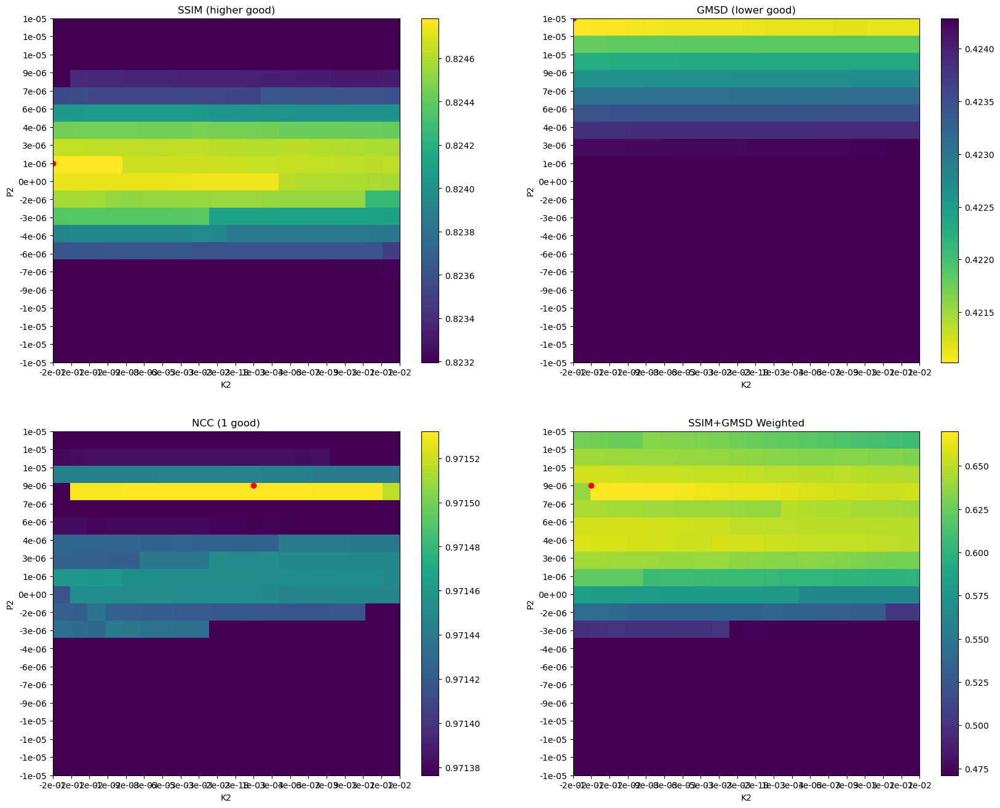

In [20]:
fig, ax = plt.subplots(2,2, figsize = (20,16))
xlabel = "K2"
ylabel = "P2"

"""
SSIM:  Best for perceptual and structural, luminosity normalized, very sensitive to structure and texture changes
NCC:   Best for overall alignemnt to detect linear shifts like Pearson doesnt handle non linear well 
GMSD:  Edge sharpness and detailed textures

So SSIM and GMSD are the main metrics, 

"""

plot_heatmap(grid, Jout[0], xlabel, ylabel,"SSIM (higher good)",make_log_range,plusminus,invert=False,marklargest=True, fig=fig, ax=ax[0,0])
plot_heatmap(grid, Jout[1], xlabel, ylabel,"GMSD (lower good)", make_log_range,plusminus,invert=True,marklargest=True, fig=fig, ax=ax[0,1])
plot_heatmap(grid, Jout[2], xlabel, ylabel,"NCC (1 good)",      make_log_range,plusminus,invert=False,marklargest=True, fig=fig, ax=ax[1,0])
# Scale each from 0 to 1 with 1  corresponding to the best result and take half from each
SSIMGMSD = (Jout[0]-Jout[0].min()) / (2*(Jout[0].max()-Jout[0].min())) + (Jout[1].max()-Jout[1])/(2*(Jout[1].max()-Jout[1]).max())
plot_heatmap(grid,SSIMGMSD , xlabel, ylabel,"SSIM+GMSD Weighted",  make_log_range,plusminus,invert=False,marklargest=True, fig=fig, ax=ax[1,1])
# Reload data in case of marklargest
with open(fname, 'rb') as f:
    results = pickle.load(f)
x0, fval, grid,Jout =  results 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Mean perc difference: 0.4638175656616942


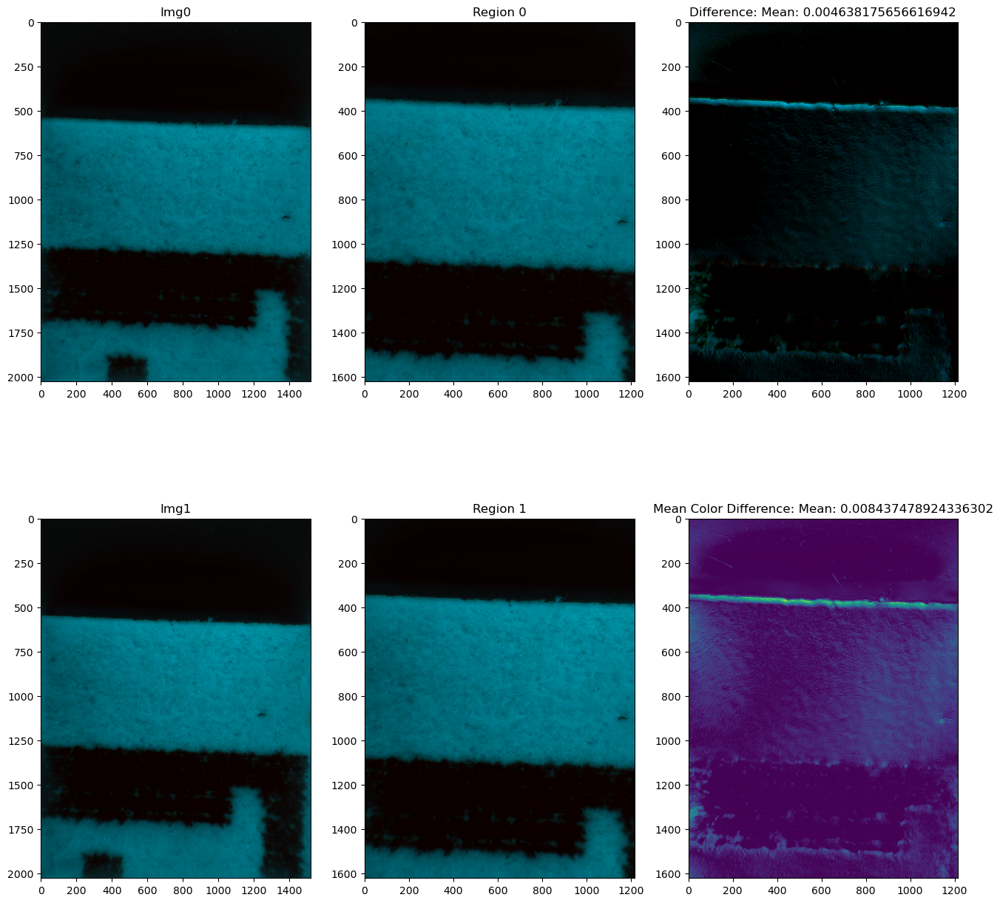

In [ ]:
# Sanity check single image : imgs, regions, difference
img_indx = 0
xs, ys = 0,0
# Select maximum value from last run
K2, P2 = grid[0].flatten()[np.nanargmax(Jout)],grid[1].flatten()[np.nanargmax(Jout)]
if make_log_range:
    K2, P2 = 10.0**K2 * plusminus[0], 10.0**P2 * plusminus[1]
K1, P1 = 0.0079, -1.06e-06
K3     = 0

xc, yc = 1520//2+xs, 2028//2+ys
coeffs=[xc,yc, K1,K2,K3, P1,P2]

region0, region1 = sanity_check(image_sets[img_indx], rel_shifts_search[img_indx], coeffs)
imgs = image_sets[img_indx]

fig,ax = plt.subplots(2,3,figsize=(16,16))

ax[0,0].imshow(imgs[0])
ax[0,0].set_title("Img0")

ax[1,0].imshow(imgs[1])
ax[1,0].set_title("Img1")

ax[0,1].imshow(region0)
ax[0,1].set_title("Region 0")

ax[1,1].imshow(region1)
ax[1,1].set_title("Region 1")

diff = (region1/1.0-region0/1.0)
ax[0,2].imshow(diff/diff.max())
ax[0,2].set_title("Difference: Mean: {}".format(diff.mean()/255))

avg = np.abs(((region1/1.0).sum(axis=-1))/3-(region0/1.0).sum(axis=-1)/3)
ax[1,2].imshow((avg)/(avg).max()) 
ax[1,2].set_title("Mean Color : Difference Mean: {}".format(avg.mean()/255))

print("Mean perc difference: {}".format(np.mean(diff)/255*100))

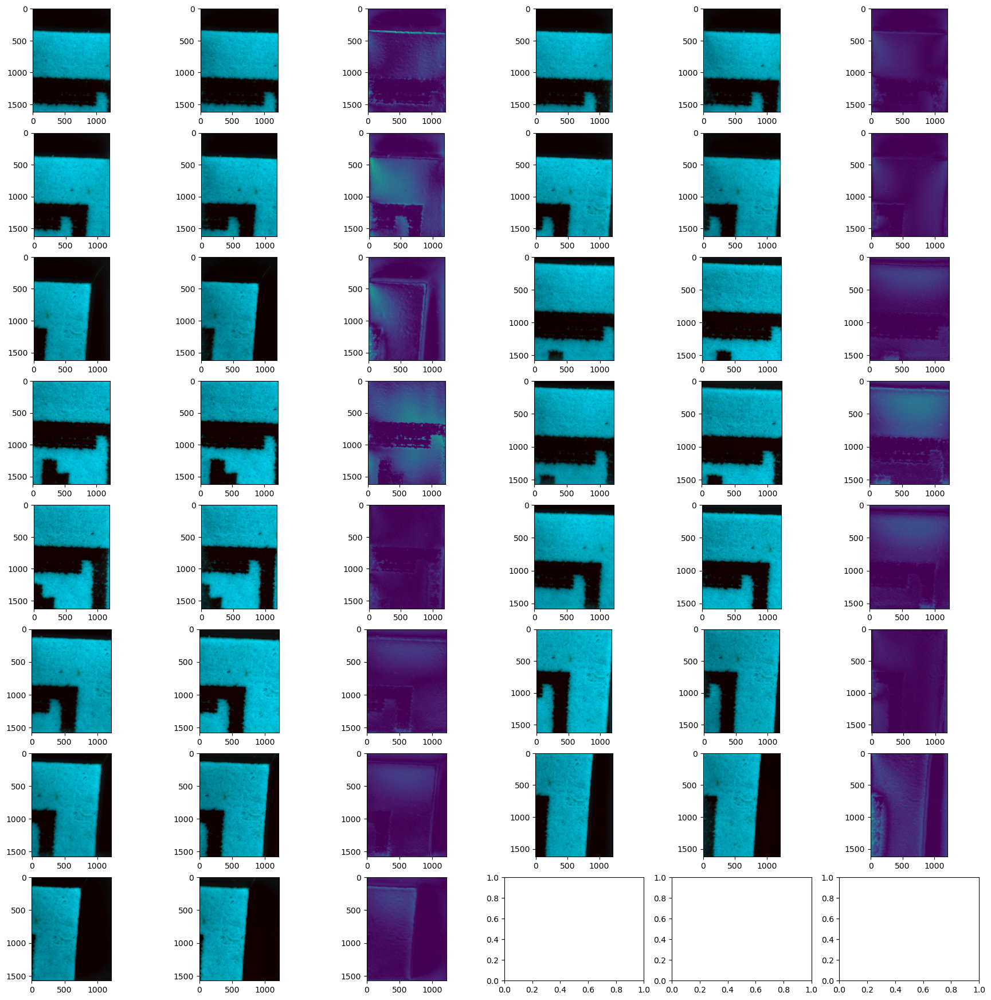

In [5]:
# Sanity Check all images transformed according to best and region extracted
fig, ax = plt.subplots(3*len(image_sets)//6 + (3*len(image_sets)%6 != 0),6,figsize = (22,22))
ax = ax.flatten()

xs, ys = 0,0
# Select maximum value from last run
K2, P2 = grid[0].flatten()[np.nanargmax(Jout)],grid[1].flatten()[np.nanargmax(Jout)]
if make_log_range:
    K2 = 10.0**K2 * plusminus[0]
    P2 = 10.0**P2 * plusminus[1]
K1, P1 = 0.0079, -1.06e-06
K3     = 0

xc, yc = 1520//2+xs, 2028//2+ys
coeffs=[xc,yc, K1,K2,K3, P1,P2]

ctr = 0
for i in range(len(image_sets)):
    # Map and extract
    region0, region1 = sanity_check(image_sets[i], rel_shifts_search[i], coeffs)
    ax[ctr].imshow(region0/region0.max())
    ax[ctr+1].imshow(region1/region1.max())
    diff = np.abs(np.mean(region0, axis=-1) - np.mean(region1, axis=-1))
    ax[ctr+2].imshow(diff/diff.max())
    ctr += 3

plt.show()

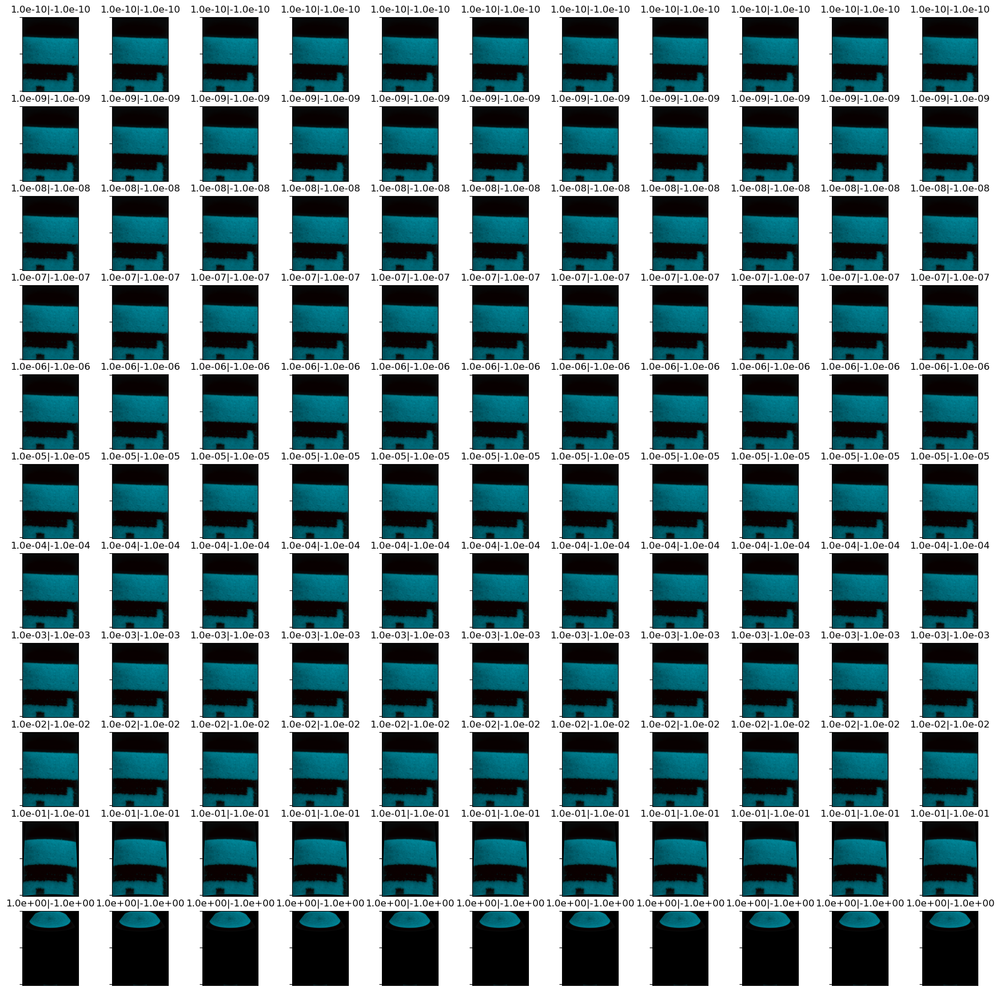

In [ ]:
# Sanity Check one image all transformations
from LensDistortionFitting import generate_CameraMatrixParameters
import cv2 as cv

num_im = grid[0].shape[0] * grid[1].shape[1]
fig, ax = plt.subplots(grid[0].shape[0],grid[1].shape[1],figsize = (22,22))
ax = ax.flatten()

xs, ys = 0,0
# Select maximum value from last run
K2, P2 = grid[0].flatten()[np.nanargmax(Jout)],grid[1].flatten()[np.nanargmax(Jout)]
K1, P1 = 0.0079, -1.06e-06
K3     = 0

img = image_sets[0,0]

xc, yc = 1520//2+xs, 2028//2+ys
coeffs=[xc,yc, K1,K2,K3, P1,P2]

k1s = grid[0].flatten()
p1s = grid[0].flatten()
for i in range(num_im):
    # Do transformation
    if make_log_range:  
        K1 = np.power(10.0,k1s[i]) * plusminus[0]   
        P1 = np.power(10.0,p1s[i]) * plusminus[1]
    else:
        K1 = k1s[i]
        P1 = p1s[i]

    coeffs=[xc,yc, K1,K2,K3, P1,P2]
    cameraMatrix, distCoeffs = generate_CameraMatrixParameters(coeffs)
    h, w = imgs.shape[1:3]
    new_camera_matrix, roi = cv.getOptimalNewCameraMatrix(cameraMatrix, distCoeffs, (w, h), 1, (w, h))
    mapx, mapy = cv.initUndistortRectifyMap(cameraMatrix, distCoeffs, None, new_camera_matrix, (w, h), 5)
    ax[i].imshow(cv.remap(img, mapx, mapy, cv.INTER_LINEAR))
    ax[i].set_title("{:.1e}|{:.1e}".format(K1, P1))
    ax[i].set_xticks([])
    ax[i].set_xticks([])
    ax[i].set_xticklabels([])
    ax[i].set_yticklabels([])

plt.show()

Mean diff: 1.91% And std: 0.633


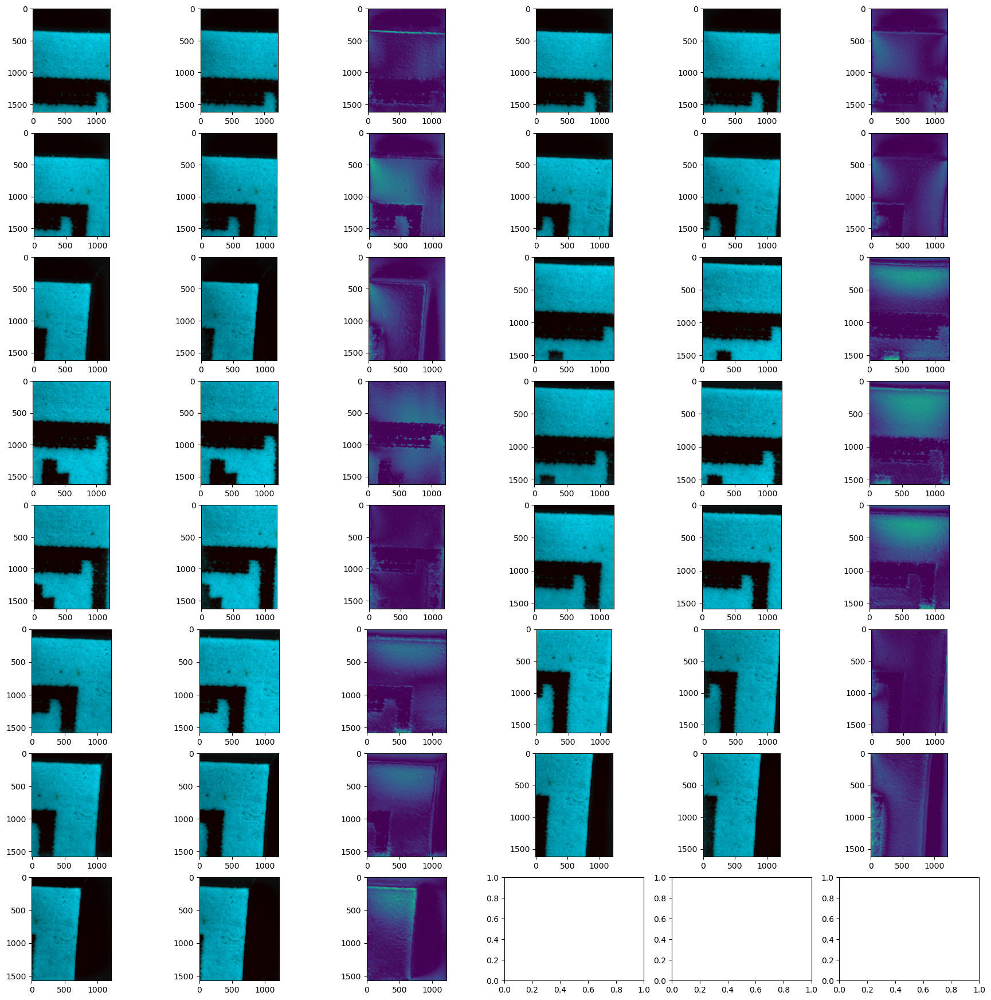

In [ ]:
# Sanity Check source data alignment:
from LensDistortionFitting import generate_image_sets,compute_region_coordinates

image_sets, rel_shifts_search = generate_image_sets()

fig, ax = plt.subplots(3*len(image_sets)//6 + (3*len(image_sets)%6 != 0),6,figsize = (22,22))
ax = ax.flatten()
h, w, _ = image_sets[0,0].shape
ctr = 0
_means = []
for i in range(len(image_sets)):
    # Find bounds and extract
    r1,r2 = compute_region_coordinates((w,h), copy.deepcopy(rel_shifts_search[i]))
    region0 = image_sets[i,0,r1[0]:r1[1],r1[2]:r1[3],:]
    region1 = image_sets[i,1,r2[0]:r2[1],r2[2]:r2[3],:]

    # Normalize to one another

    ax[ctr].imshow(region0/region0.max())
    ax[ctr+1].imshow(region1/region1.max())
    diff = np.abs(np.mean(region0, axis=-1) - np.mean(region1, axis=-1))
    _means.append(diff.mean()/255*100)
    ax[ctr+2].imshow(diff/diff.max())
    ctr += 3
print("Mean diff: {:.3}% And std: {:.3}".format(np.array(_means).mean(), np.array(_means).std()))
plt.show()

### Show and Tell

In [21]:
# Sanity check
xc, yc = 1520//2, 2028//2
path = '/home/felix/RapidStorage2/LensDistortion'
K1, P1 =0.0079, -1.06e-06
K2,P2 = 0.009 ,-1.35e-05
K3,P3 = 0,0
print("Processing K1:{}, P1:{}".format(K1,P1))
imgs = image_sets[0]
rel_pos = rel_shifts_search[0]
r1, r2 = sanity_check(imgs, rel_pos, [xc,yc, K1,K2,K3,P1,P2])

Processing K1:0.0079, P1:-1.06e-06


Mean diff 0.008726459411505958


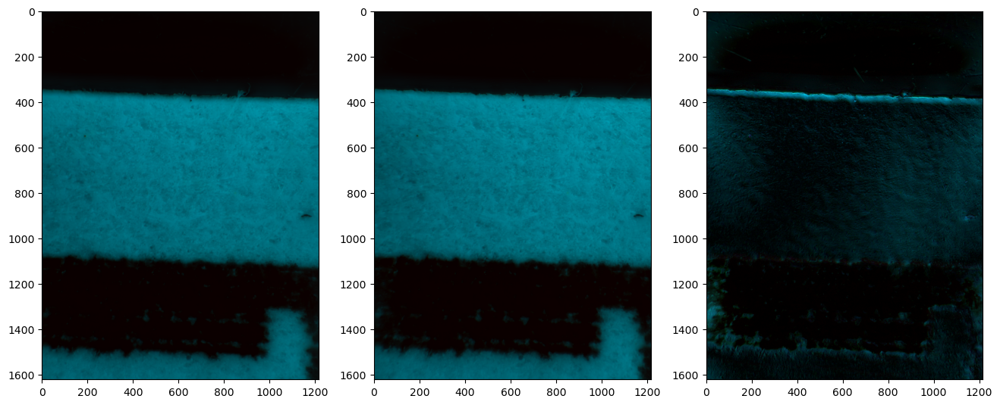

In [23]:
fig,ax = plt.subplots(1,3,figsize=(16,8))
ax[0].imshow(r1)
ax[1].imshow(r2)
d =np.abs(r1/255 - r2/255)
print("Mean diff {}".format(d.mean()))
ax[2].imshow((d-d.min())/(d.max()-d.min()))

## Testing Image alignment metrics

ORB performs well, however, it probably wont for more difficult alignment tasks. 
SIFT we will see, but it appears very computationally complex

For final alignment use both concatenate matches and descriptors and apply ransac

We can then discard alignment if the length(inliers)/len(matches) < 0.25 or the like, the actual limit will have to be modified


Complexity:
- SIFT : O(N log N + K) : N image size, K : keypoints
- ORB : O(N + K)

In [3]:
with h5py.File("../CalibrationData/Calibration.hdf5", "r") as f:
    flat = f['flat'][()]
    blackpoint = f['Blackpoint'][()]

In [105]:
# Load images for alignment
from PIL import Image
from LensDistortionFitting import generate_CameraMatrixParameters
import cv2 as cv

path = "/home/felix/RapidStorage2/LensDistortion"
image_sets, rel_shifts_search = generate_image_sets()

# Apply lens correction
def apply_lens_correction_to_pair(imgs, coeffs):
    cameraMatrix, distCoeffs = generate_CameraMatrixParameters(coeffs)
    h, w = imgs.shape[1:3]
    new_camera_matrix, roi = cv.getOptimalNewCameraMatrix(cameraMatrix, distCoeffs, (w, h), 1, (w, h))

    # Calculate the map for remapping
    mapx, mapy = cv.initUndistortRectifyMap(cameraMatrix, distCoeffs, None, new_camera_matrix, (w, h), 5)
    # Remap the images 
    imgs_ = np.empty_like(imgs)
    for i in range(2):
        imgs_[i] = cv.remap(imgs[i], mapx, mapy, cv.INTER_LINEAR)
    return imgs_
K1, P1 = 0.0079, -1.06e-06
xc,yc,K2,K3,P2 = 0,0,0,0,0
image_sets[0] = apply_lens_correction_to_pair(image_sets[0], [xc,yc, K1,K2,K3,P1,P2])

#### ORB feature alignment

(2.4580335764996555, 69.08353437847707, 0.0)

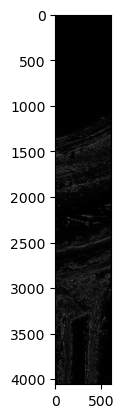

In [482]:
im1sub  = oimg1[:,-wo:,:] # Left Image
im2sub  = oimg2[:,:wo,:] # Right Image
from skimage.filters import sobel
#im1sub = resize(downscale_local_mean(im1sub, (2,2,1)), im1sub.shape)
#im2sub = resize(downscale_local_mean(im2sub, (2,2,1)), im1sub.shape)
im1sub = im1sub.mean(axis=-1)
im2sub = im2sub.mean(axis=-1)

#im1sub = (im1sub - im1sub.min())/(im1sub.max()-im1sub.min())
#im2sub = (im2sub - im2sub.min())/(im2sub.max()-im2sub.min())


im1sub = (sobel(im1sub))
im2sub = (sobel(im2sub))

#im1sub = im1sub/im1sub.max()
#im2sub = im2sub/im2sub.max()

plt.imshow(im1sub)
im1sub.mean(), im1sub.max(), im1sub.min()

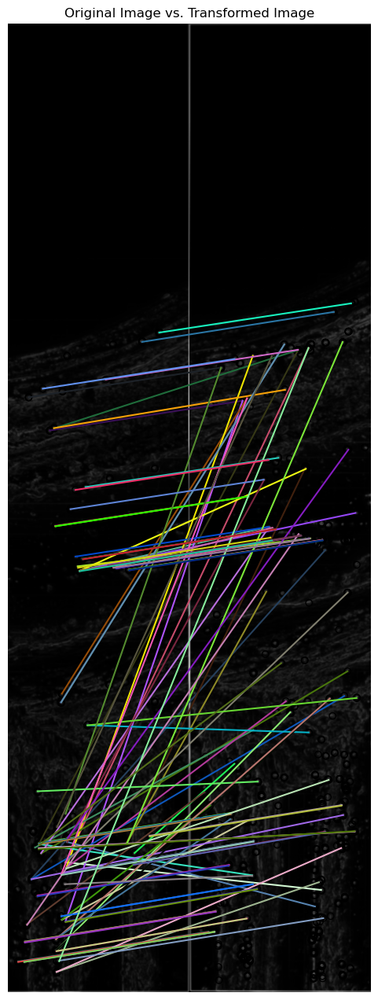

In [87]:
# SKImage Based trials
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
import numpy as np
from skimage.feature import match_descriptors, ORB, plot_matches
from skimage.transform import downscale_local_mean, resize
from skimage.filters import laplace, gaussian, sobel, threshold_local
from LensDistortionFitting import generate_image_sets, generate_CameraMatrixParameters
from PIL import Image
import cv2 as cv
import os 
def apply_lens_correction_to_pair(imgs, coeffs):
    focl_lenght_pxs = np.array([8, 8]) * imgs.shape[0:2] / np.array([7.564,5.467])
    cameraMatrix, distCoeffs = generate_CameraMatrixParameters(coeffs, focl_lenght_pxs)
    h, w = imgs.shape[0:2]
    new_camera_matrix, roi = cv.getOptimalNewCameraMatrix(cameraMatrix, distCoeffs, (w, h), 1, (w, h))

    # Calculate the map for remapping
    mapx, mapy = cv.initUndistortRectifyMap(cameraMatrix, distCoeffs, None, new_camera_matrix, (w, h), 5)
    return cv.remap(imgs, mapx, mapy, cv.INTER_LINEAR)
K1, P1 = 0.0079, -1.06e-06
#image_sets, rel_shifts_search = generate_image_sets()
oimg1, oimg2 = [np.array(Image.open(i)) for i in ["/home/felix/RapidStorage2/Tnut/Focused_y=61801_z=30880_e=16000.png","/home/felix/RapidStorage2/Tnut/Focused_y=61801_z=15440_e=16000.png"]]
xc,yc,K2,K3,P2 = *oimg1.shape[0:2],0,0,0
xc, yc = xc//2, yc//2

oimg1 = apply_lens_correction_to_pair(oimg1, [xc,yc, K1,K2,K3,P1,P2])
oimg2 = apply_lens_correction_to_pair(oimg2, [xc,yc, K1,K2,K3,P1,P2])
# For these we expect a 20% overlap in width so we keep 30 % of the image
h,w, _ = oimg1.shape
wo = int(w * 0.25)
im1sub  = oimg1[:,-wo:,:] # Left Image
im2sub  = oimg2[:,:wo,:] # Right Image

im1sub = im1sub.mean(axis=-1)
im2sub = im2sub.mean(axis=-1)
#im1sub = gaussian(im1sub, sigma=1.5)
#im2sub = gaussian(im2sub, sigma=1.5)
im1sub = sobel(im1sub)
im2sub = sobel(im2sub)
im1sub = threshold_local(im1sub, block_size=15)
im2sub = threshold_local(im2sub, block_size=15)

# Normalize
im1sub = (im1sub - im1sub.min())/(im1sub.max()-im1sub.min())
im2sub = (im2sub - im2sub.min())/(im2sub.max()-im2sub.min())

#im1sub = resize(downscale_local_mean(im1sub, (2,2)), im1sub.shape)
#im2sub = resize(downscale_local_mean(im2sub, (2,2)), im1sub.shape)

def do_matching(im1sub,im2sub):
    descriptor_extractor = ORB(n_keypoints=2000)
    # Get Image keypoints
    descriptor_extractor.detect_and_extract(im1sub)
    keypoints1 = descriptor_extractor.keypoints
    descriptors1 = descriptor_extractor.descriptors
    descriptor_extractor.detect_and_extract(im2sub)
    keypoints2 = descriptor_extractor.keypoints
    descriptors2 = descriptor_extractor.descriptors
    # This contains indices for matches where [:, 0] is for the first and [:, 1] is for the second image
    matches12 = match_descriptors(descriptors1, descriptors2, cross_check=True)
    return matches12, keypoints1, keypoints2

matches12, keypoints1, keypoints2 = do_matching(im1sub,im2sub)

def make_bool_map(keypoints1, keypoints2, matches12):
    diff = keypoints1[matches12[:,0]] - keypoints2[matches12[:,1]]# Order is h,w
    return (diff[:,0] > diff[:,1]) #& (np.abs(diff[:, 0]) <= 0.75 * np.abs(diff[:, 1]))

boolmap = make_bool_map(keypoints1, keypoints2, matches12)

fig, ax = plt.subplots(nrows=1, ncols=1,figsize=(16,16))

plt.gray()

plot_matches(ax, im1sub, im2sub, keypoints1, keypoints2, matches12[boolmap,:])
ax.axis('off')
ax.set_title("Original Image vs. Transformed Image")

plt.show()

#### RANSAC keypoint filtering

In [88]:
from skimage.measure import ransac
from skimage.transform import EuclideanTransform, warp
import skimage
def get_unique_transformations(matches12, keypoints1, keypoints2, boolmap, n=200):
    """
    Ransac is random so supplies different solutions at times [nan, nan] and sometimes None
    """
    unique_transforms = []
    for _ in range(n):
        try:
            # Filter matches based on the boolmap and retrieve corresponding keypoints
            match1, match2 = keypoints1[matches12[boolmap, 0]], keypoints2[matches12[boolmap, 1]]

            # Using RANSAC to find the Euclidean transform
            model_robust, inliers = ransac((match1, match2), EuclideanTransform, min_samples=5,
                                           residual_threshold=1, max_trials=1000)
            if model_robust is not None and not np.any(np.isnan(model_robust.params)):
                # Invert the translation direction
                inverted_translation = np.round(-model_robust.translation[::-1]).astype('int')
                # Check if the found transformation is unique
                if all(not np.allclose(inverted_translation, i, atol=1e-2) for i in unique_transforms):
                    unique_transforms.append(inverted_translation)
                    print(f"Unique Transformation Found: {inverted_translation}, Mean Inliers: {np.mean(inliers)}")
        except Exception as e:
            pass
    
    return unique_transforms

translation = get_unique_transformations(matches12,keypoints1,keypoints2,boolmap)
len(translation)

Unique Transformation Found: [-55 126], Mean Inliers: 0.07272727272727272
Unique Transformation Found: [-57 126], Mean Inliers: 0.05454545454545454
Unique Transformation Found: [-57 127], Mean Inliers: 0.09090909090909091
Unique Transformation Found: [ 68 122], Mean Inliers: 0.03636363636363636
Unique Transformation Found: [-55 127], Mean Inliers: 0.03636363636363636
Unique Transformation Found: [-60 127], Mean Inliers: 0.06363636363636363
Unique Transformation Found: [-62 126], Mean Inliers: 0.03636363636363636
Unique Transformation Found: [-46 126], Mean Inliers: 0.03636363636363636
Unique Transformation Found: [-66 128], Mean Inliers: 0.03636363636363636
Unique Transformation Found: [-59 127], Mean Inliers: 0.03636363636363636
Unique Transformation Found: [-56 127], Mean Inliers: 0.06363636363636363
Unique Transformation Found: [-31 122], Mean Inliers: 0.045454545454545456
Unique Transformation Found: [-61 126], Mean Inliers: 0.05454545454545454
Unique Transformation Found: [-61 127

50

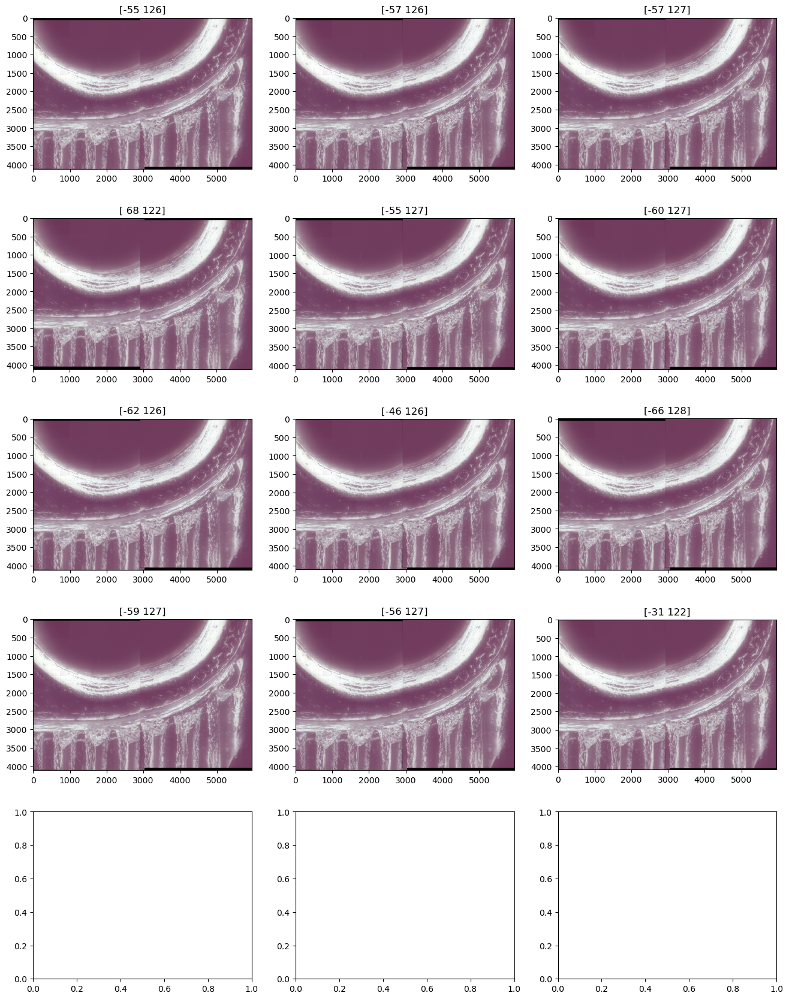

In [93]:
translation_ = translation[:12]
ax_extra = 1 if 0.0!=len(translation)%3 else 0
fig, ax = plt.subplots(len(translation_)//3+ax_extra,3,figsize=(16,(len(translation_)//2+ax_extra)*3))
ax = ax.flatten()
rh,rw,_ = oimg1.shape
# Total dimension for now
th, tw = 6000,7000
oh, ow = int(rh*0.2), int(rw*0.2)
for i in range(len(translation_)):
    # Shift rel to 0.2 overlap
    try:
        sh,sw = translation_[i]#np.round(translation_[i]).astype('int')
        sh = sh
        sw = -sw
        fim = np.zeros((th, tw,3))
        # First image position, Shifted down if second image is shifted up
        im1_pos = [0,0 if sh > 0 else -sh]
        # im2 pos 
        im2sh = sh if sh > 0 else 0
        im2_pos = [rw + sw  , im2sh]
        # h,w
        fim[im1_pos[1]:im1_pos[1]+rh,im1_pos[0]:im1_pos[0]+rw,:] = oimg1[:,:,:]
        fim[im2_pos[1]:im2_pos[1]+rh,im2_pos[0]:im2_pos[0]+rw,:] = oimg2[:,:,:]

        non_black_rows = np.any(np.any(fim > 0, axis=2), axis=1)
        non_black_cols = np.any(np.any(fim > 0, axis=2), axis=0)

        fim = fim[non_black_rows][:, non_black_cols]

        ax[i].set_title(str(translation_[i])) # 820, 79 best but slightly off
        ax[i].imshow(fim/fim.max())
    except:
        pass
#fig.show()

#### SIFT feature alignment 
https://scikit-image.org/docs/stable/auto_examples/features_detection/plot_sift.html#sphx-glr-auto-examples-features-detection-plot-sift-py

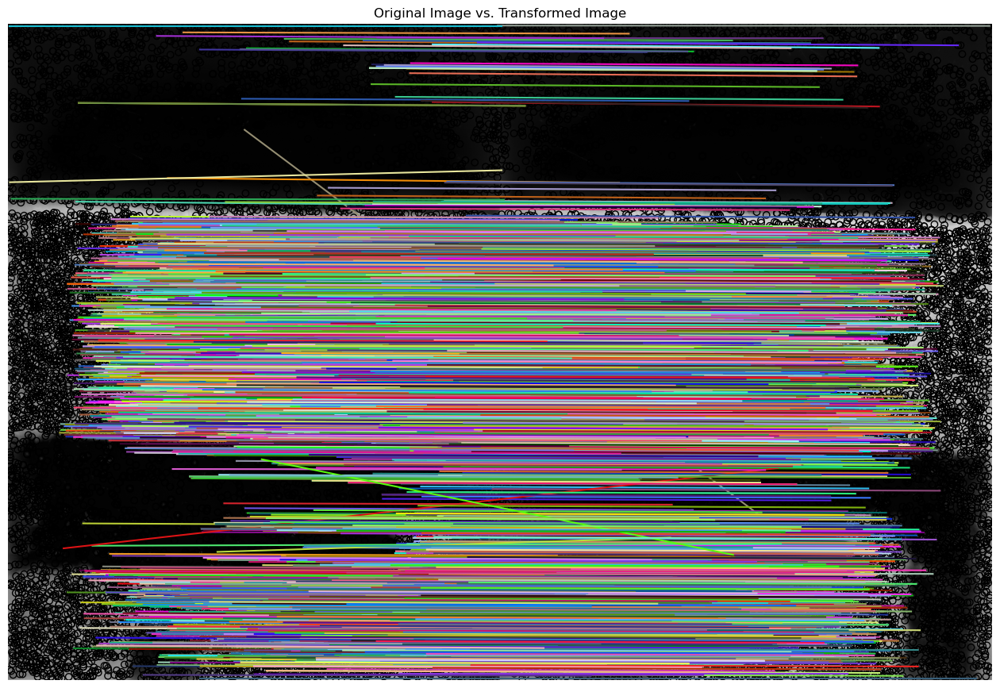

In [178]:
from skimage.feature import match_descriptors, SIFT, plot_matches
descriptor_extractor = SIFT(upsampling=1)
img1 = image_sets[0,0].mean(axis=-1)
img2 = image_sets[0,1].mean(axis=-1)

descriptor_extractor.detect_and_extract(img1)
keypoints1 = descriptor_extractor.keypoints
descriptors1 = descriptor_extractor.descriptors

descriptor_extractor.detect_and_extract(img2)
keypoints2 = descriptor_extractor.keypoints
descriptors2 = descriptor_extractor.descriptors

matches12 = match_descriptors(
    descriptors1, descriptors2, max_ratio=0.6, cross_check=True
)


fig, ax = plt.subplots(nrows=1, ncols=1,figsize=(16,16))

plt.gray()

plot_matches(ax, img1, img2, keypoints1, keypoints2, matches12)
ax.axis('off')
ax.set_title("Original Image vs. Transformed Image")

plt.show()

[136.57818563  -4.52957281]


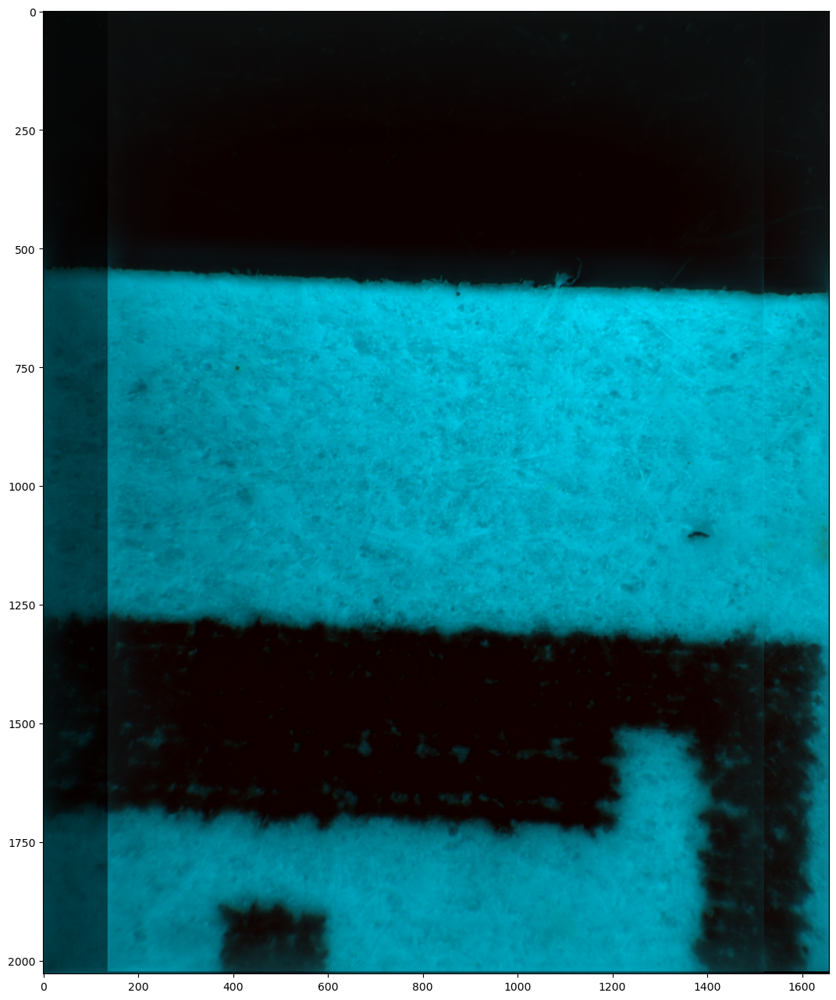

In [179]:
from skimage.measure import ransac
from skimage.transform import EuclideanTransform, warp
import skimage
match1, match2 = keypoints1[matches12[:,0]], keypoints2[matches12[:,1]]

# Using RANSAC
transform_robust, inliers = ransac((match1, match2), EuclideanTransform, min_samples = 5, residual_threshold = 0.5, max_trials = 1000)
transform = EuclideanTransform
# Invert the translation
transform_robust = transform(rotation = 0) + transform(translation = -(transform_robust.translation)[::-1])

# Apply transformation to image
image = warp(image_sets[0,1], transform_robust.inverse, output_shape=(np.round(image_sets[0,1].shape[0:2]+np.array([i if i>0 else 0 for i in transform_robust.translation ])[::-1]).astype('int')), order = 1, mode = "constant", cval = 0, clip = False, preserve_range = True)
print(transform_robust.translation )
print(np.mean(inliers))
fig = plt.figure(figsize=(16,16))
h,w,_ = image_sets[0,0].shape
image[:h,:w] = image[:h,:w]/2.0
image[:h,:w] += image_sets[0,0][:,:]/2.0
plt.imshow(image/image.max())

#### Combined SIFT and ORB

Completed ORB after 257.08578538894653 s
Completed SIFT after 269.4924850463867 s
relative weights:  [0.80487805 0.19512195]
[[-9.15040401e-14 -6.65483928e-14]
 [ 4.59512602e+00 -2.66930018e+01]]
Transformation:
[3.41060513e-13 1.13686838e-13]
Confidence
1.0
Total 269.6086394786835 s


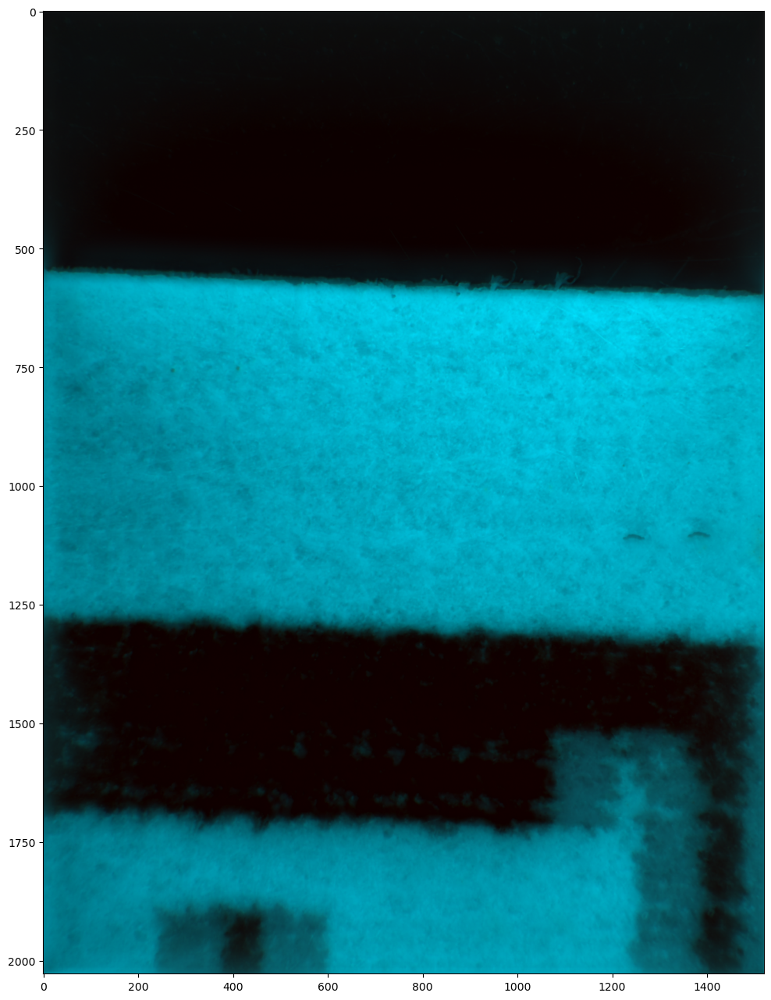

In [217]:
import time
img2 = image_sets[0,1].mean(axis=-1)
img1 = image_sets[0,0].mean(axis=-1)
start = time.time()

Odescriptor_extractor = ORB(n_keypoints=500)
Odescriptor_extractor.detect_and_extract(img1)
Okeypoints1 = Odescriptor_extractor.keypoints
Odescriptors1 = Odescriptor_extractor.descriptors
Odescriptor_extractor.detect_and_extract(img2)
Okeypoints2 = Odescriptor_extractor.keypoints
Odescriptors2 = Odescriptor_extractor.descriptors
Omatches12 = match_descriptors(Odescriptors1, Odescriptors2, cross_check=True)
Omatch1, Omatch2 = Okeypoints1[Omatches12[:,0]], Okeypoints2[Omatches12[:,1]]
Otransform_robust, Oinliers = ransac((Omatch1, Omatch2), EuclideanTransform, min_samples = 5, residual_threshold = 0.5, max_trials = 1000)
print("Completed ORB after {} s".format(time.time()-start))

Sdescriptor_extractor = SIFT(upsampling=1)
Sdescriptor_extractor.detect_and_extract(img1)
Skeypoints1 = Sdescriptor_extractor.keypoints
Sdescriptors1 = Sdescriptor_extractor.descriptors
Sdescriptor_extractor.detect_and_extract(img2)
Skeypoints2 = Sdescriptor_extractor.keypoints
Sdescriptors2 = Sdescriptor_extractor.descriptors
Smatches12 = match_descriptors(Sdescriptors1, Sdescriptors2, cross_check=True)
Smatch1, Smatch2 = Skeypoints1[Smatches12[:,0]], Skeypoints2[Smatches12[:,1]]
Stransform_robust, Sinliers = ransac((match1, match2), EuclideanTransform, min_samples = 5, residual_threshold = 0.5, max_trials = 1000)
print("Completed SIFT after {} s".format(time.time()-start))

rel_weights = np.array([Sinliers.mean(), Oinliers.mean()])
rel_weights /= np.sum(rel_weights)
print("relative weights: ",rel_weights)
translation = np.array([Stransform_robust.translation, Otransform_robust.translation])
translation = np.array([translation * rel_weights]).sum(axis=0)

print(translation)

transform = EuclideanTransform
# Invert the translation
transform_robust = transform(translation = -(translation)[::-1])
# Apply transformation to image
image = warp(image_sets[0,1], transform_robust.inverse, output_shape=(np.round(image_sets[0,1].shape[0:2]+np.array([i if i>0 else 0 for i in translation ])[::-1]).astype('int')), order = 1, mode = "constant", cval = 0, clip = False, preserve_range = True)
print("Transformation:")
print(transform_robust.translation )
print("Confidence")
print(np.mean(inliers))
print("Total {} s".format(time.time()-start))
fig = plt.figure(figsize=(16,16))
h,w,_ = image_sets[0,0].shape
image[:h,:w] = image[:h,:w]/2.0
image[:h,:w] += image_sets[0,0][:,:]/2.0
plt.imshow(image/image.max())

In [223]:
rel_weights = np.array([Sinliers.mean(), Oinliers.mean()])
rel_weights /= np.sum(rel_weights)
print("relative weights: ",rel_weights)
translation = np.array([Stransform_robust.translation, Otransform_robust.translation])
print(translation)
translation = np.array([translation * rel_weights]).sum(axis=2)
translation


relative weights:  [0.80487805 0.19512195]
[[-1.13686838e-13 -3.41060513e-13]
 [ 5.70909596e+00 -1.36801634e+02]]


array([[-1.58052433e-13, -2.20978758e+01]])

In [225]:
Stransform_robust.translation

array([-1.13686838e-13, -3.41060513e-13])

In [200]:
keypoints1[matches12[:,0]].shape, keypoints2[matches12[:,1]].shape

((500, 2), (500, 2))

In [203]:
matches12.shape

(500, 2)

Matched descriptors after 1516.3246159553528 s


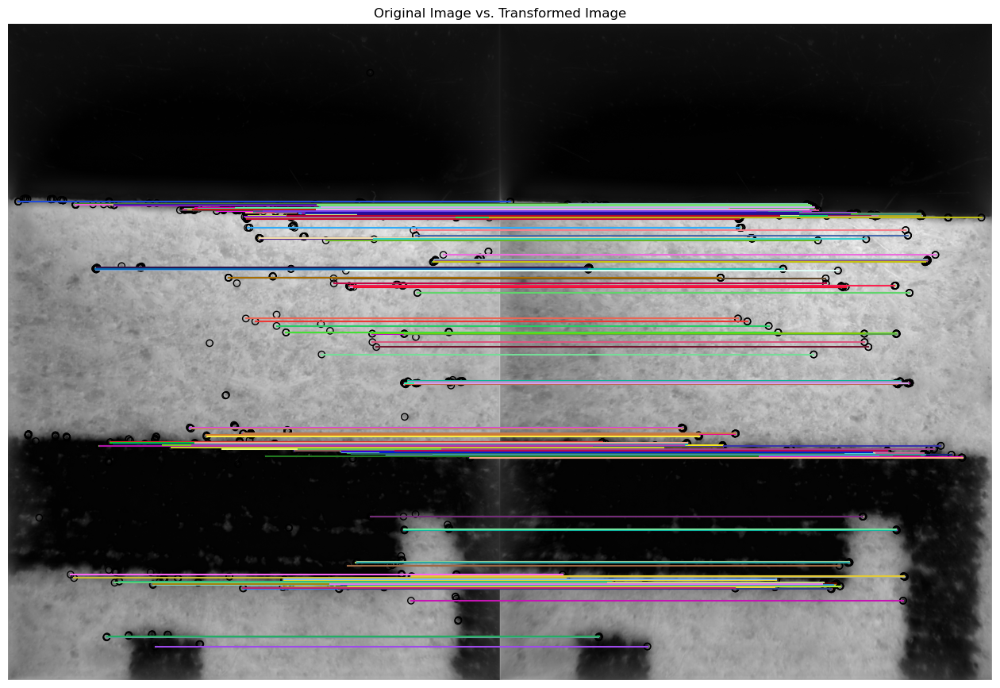

In [210]:
fig, ax = plt.subplots(nrows=1, ncols=1,figsize=(16,16))


matches12 = match_descriptors(
    descriptors1, descriptors2, cross_check=True
)
print("Matched descriptors after {} s".format(time.time()-start))

match1, match2 = keypoints1[matches12[:,0]], keypoints2[matches12[:,1]]

# Using RANSAC
transform_robust, inliers = ransac((match1, match2), EuclideanTransform, min_samples = 5, residual_threshold = 0.5, max_trials = 1000)

plt.gray()

plot_matches(ax, img1, img2, keypoints1, keypoints2, matches12)
ax.axis('off')
ax.set_title("Original Image vs. Transformed Image")

plt.show()